# Imports

In [1]:
import numpy as np, matplotlib.pyplot as plt, matplotlib as mpl
import pcmdpy as ppy
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import easydarkfigs
%matplotlib inline

In [2]:
%set_darkfigdir figures_dark/
%set_lightfigdir figures/

In [3]:
import os
from glob import glob

In [4]:
plt.style.use('cook')

In [5]:
%%time
from results import models, results, pcmds, data, radii_am, radii_kpc, dmods, regions
import results as rr

CPU times: user 21.5 ms, sys: 4.65 ms, total: 26.2 ms
Wall time: 31.7 ms


In [6]:
%%time
from drivers import filters, iso_models, drivers, sky

Loading Isochrone Models
CPU times: user 43 s, sys: 8.66 s, total: 51.7 s
Wall time: 54.6 s


GPU acceleration not available. Continuing without.GPU acceleration not available. Continuing without.GPU acceleration not available. Continuing without.GPU acceleration not available. Continuing without.GPU acceleration not available. Continuing without.GPU acceleration not available. Continuing without.GPU acceleration not available. Continuing without.GPU acceleration not available. Continuing without.

# Setup

In [6]:
def plot_tau_cumulative(tau, ax=None, iso_step=0.01, lower=7.0, upper=10.1, xtext=7.5, text_kwargs={}, **kwargs):
    if ax is None:
        _, ax = plt.subplots(figsize=(8,5))
    m = ppy.sfhmodels.TauModel(np.array([0., tau]), iso_step=-1)
    m.iso_edges = np.arange(0., 10.2, iso_step)
    ages, sfhs = m.get_vals()
    idx = (ages >= lower)&(ages<=upper)
    x = ages[idx]
    y = np.cumsum(sfhs)[idx]
    y /= y.max()
    ax.plot(x, y, **kwargs)
    kws = {'verticalalignment': 'bottom',
          'horizontalalignment':'left',
          'fontsize': 14, 
          'rotation': 14.}
    kws.update(text_kwargs)
    ytext = y[np.argmin(np.abs(x-xtext))] * 1.05
    ax.text(xtext, ytext, r'$\tau$ = '+f'{tau:.0f} Gyr', **kws)
    return ax

In [7]:
def residuals(k, ax=None, force_resim=False, median=False, residuals=True, residual_kwargs={}, model_kwargs={}, data_kwargs={},
              bins=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(8,5))
    g = k.split('_')[0]
    if force_resim:
        if k in pcmds:
            pcmds.pop(k)
    if k not in pcmds:
        print(f'Modeling best fit for {k}')
        m = (results[k].median_model if median else results[k].best_model)
        is_ssp = isinstance(m.sfh_model, ppy.sfhmodels.SSPModel)
        if isinstance(m.distance_model, ppy.distancemodels.FixedDistance):
            m.distance_model.dmod = dmods[g]
        pcmds[k], _ = drivers[g].simulate(m, (256 if is_ssp else 128), sky_noise=sky[g], dither=False,
                                          mag_system=('ab' if g=='M31' else 'vega'), dark_per_sec=0.0127)
    pcmd_all = np.append(pcmds[k], data[k], axis=1)
    bins = bins or [np.arange(min(pcmd_all[0])-0.1, max(pcmd_all[0])+0.1, 0.05), np.arange(min(pcmd_all[1])-0.1, max(pcmd_all[1])+0.1, 0.05)]
    ppy.plotting.plot_pcmd_contours(data[k], color='k', alpha=1.0, ls='-', lw=2, label='Data', ax=ax, span=[[bins[1][0], bins[1][-1]],[bins[0][0], bins[0][-1]]], **data_kwargs)
    ppy.plotting.plot_pcmd_contours(pcmds[k], color=colors[1], alpha=1.0, ls='-', lw=1, label='Model', ax=ax, span=[[bins[1][0], bins[1][-1]],[bins[0][0], bins[0][-1]]], **model_kwargs)
    if residuals:
        a, ll, bins, norm, = ppy.plotting.plot_pcmd_residual(pcmds[k], data[k], ax=ax, bins=bins, **residual_kwargs)
    ppy.plotting.plot_isochrone(iso_models[g], axes=ax, alpha=0.)
    return ax, norm

In [8]:
%%time
for i in range(9, 12):
    print(i)
    rr.load_model(i, all_quads=(i==9))
# rr.load_model(9, all_quads=False)

8
M87
M87v2
M49
NGC3377
NGC4993
M31 Bulge
9
M87
Skipping M87_a2_m9
Skipping M87_a3_m9
Skipping M87_a4_m9
Skipping M87_b2_m9
Skipping M87_b3_m9
Skipping M87_b4_m9
Skipping M87_c2_m9
Skipping M87_c3_m9
Skipping M87_c4_m9
M87v2
M49
Skipping M49_a2_m9
Skipping M49_a3_m9
Skipping M49_a4_m9
Skipping M49_b2_m9
Skipping M49_b3_m9
Skipping M49_b4_m9
Skipping M49_c2_m9
Skipping M49_c3_m9
Skipping M49_c4_m9
NGC3377
Skipping NGC3377_a2_m9
Skipping NGC3377_a4_m9
Skipping NGC3377_b2_m9
Skipping NGC3377_b3_m9
Skipping NGC3377_b4_m9
Skipping NGC3377_c2_m9
Skipping NGC3377_c3_m9
Skipping NGC3377_c4_m9
NGC4993
Skipping NGC4993_a2_m9
Skipping NGC4993_a4_m9
Skipping NGC4993_b2_m9
Skipping NGC4993_b3_m9
Skipping NGC4993_b4_m9
Skipping NGC4993_c2_m9
Skipping NGC4993_c3_m9
Skipping NGC4993_c4_m9
M31 Bulge
10
M87
M87v2
M49
NGC3377
NGC4993
M31 Bulge
11
M87
M87v2
M49
NGC3377
NGC4993
M31 Bulge
12
M87
M87v2
M49
NGC3377
NGC4993
M31 Bulge
CPU times: user 2min 44s, sys: 2.52 s, total: 2min 47s
Wall time: 2min 51s


In [9]:
new_mlls = {}
for k in tqdm(list(pcmds.keys())):
    r = results[k]
    mll = float(r.max_logl)
    while (r.as_dynesty(max_logl=mll)['delta_logz'][-1] >= 1e-3):
        mll -= 10.
    new_mlls[k] = mll

100%|██████████| 105/105 [03:47<00:00,  2.17s/it]


In [10]:
old_mlls = {k: results[k].max_logl for k in new_mlls.keys()}

In [11]:
for k in tqdm(new_mlls.keys()):
    results[k].max_logl = new_mlls[k]

100%|██████████| 105/105 [00:13<00:00,  8.06it/s]


In [12]:
rr.add_set_v2('M87v2', 1, "wide", f'M87v2_wide_m1', 'M87_I_gI_wide')
radii_kpc[f'M31_wide_m1'] = radii_kpc[f'M87v2_b1_m9']

In [13]:
m51_desc = {
    'a': 'Gap 1',
    'b': 'Arm 1',
    'c': 'Gap 2',
    'd': 'Arm 2',
    'e': 'Inner Arm'
}

In [17]:
colors = sns.color_palette('colorblind')
markers = ['o', 'D', 's', 'p', '*', 'X', '^']

# Figure 4 - M31 Corner Plot

Saving light figure as figures/M31_e_corner.pdf
Saving dark figure as figures_dark/M31_e_corner_dark.pdf


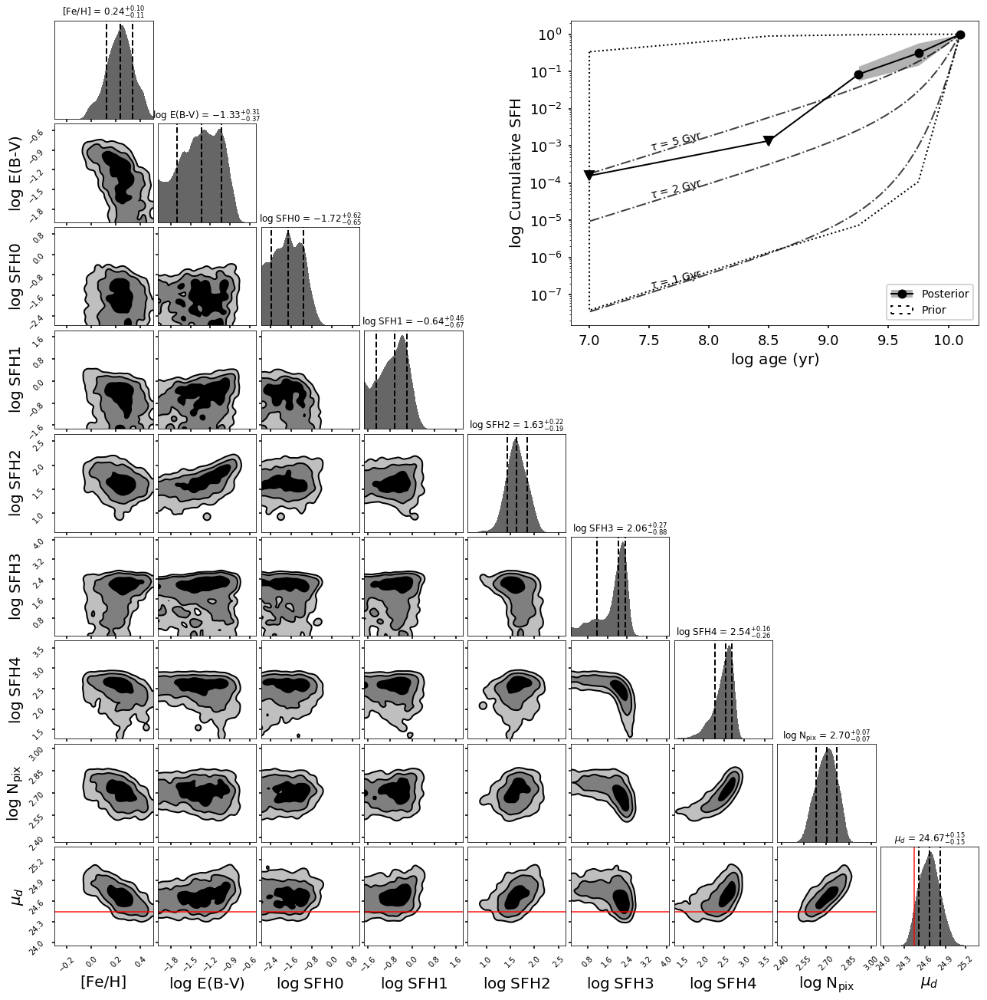

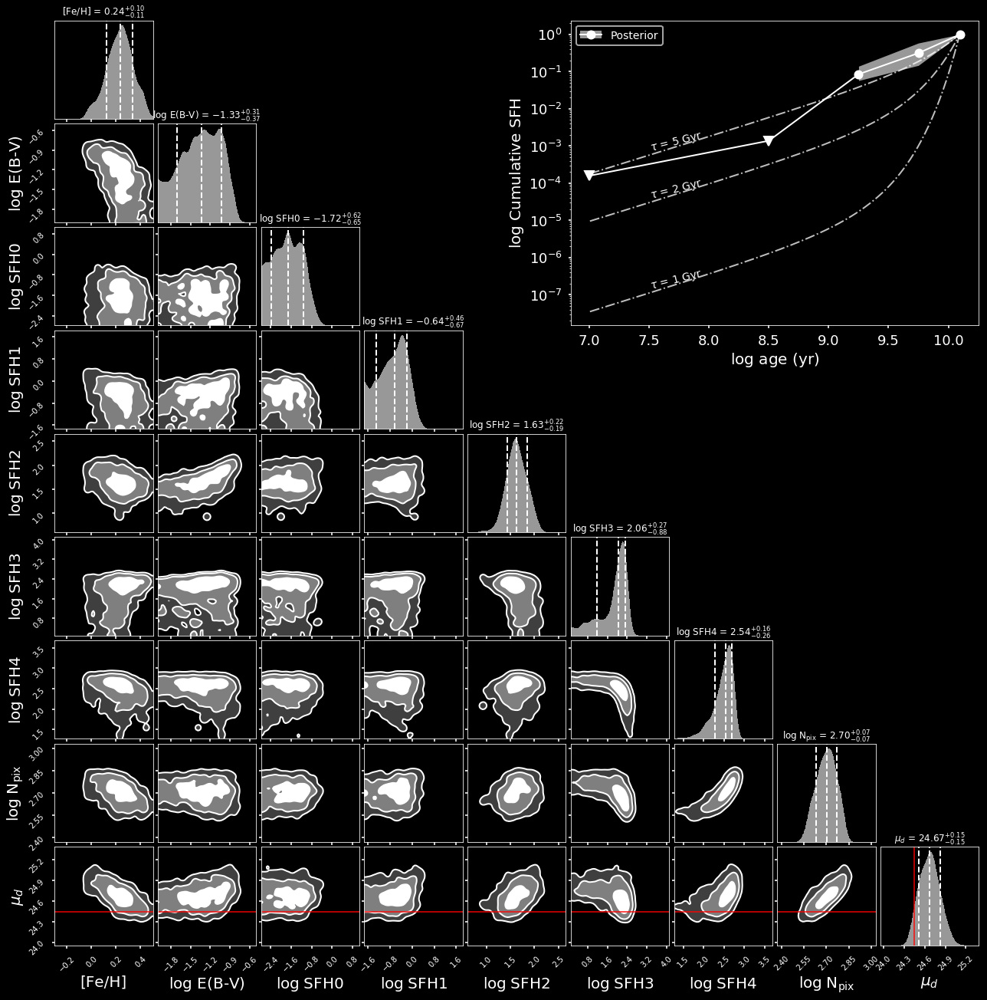

In [16]:
%%savefig_dark_light M31_e_corner.pdf
r = results['M31_e_m9']
fig, axes, axbig, lines, _, _, _ = r.plot_corner_sfh(cumulative=True, widths=[68.], sfh_kwargs={'dark':is_dark, 'show_prior': (not is_dark), 'show_uppers': True});
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=axbig, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')

Saving light figure as figures/NGC3377_b_corner.pdf
Saving dark figure as figures_dark/NGC3377_b_corner_dark.pdf


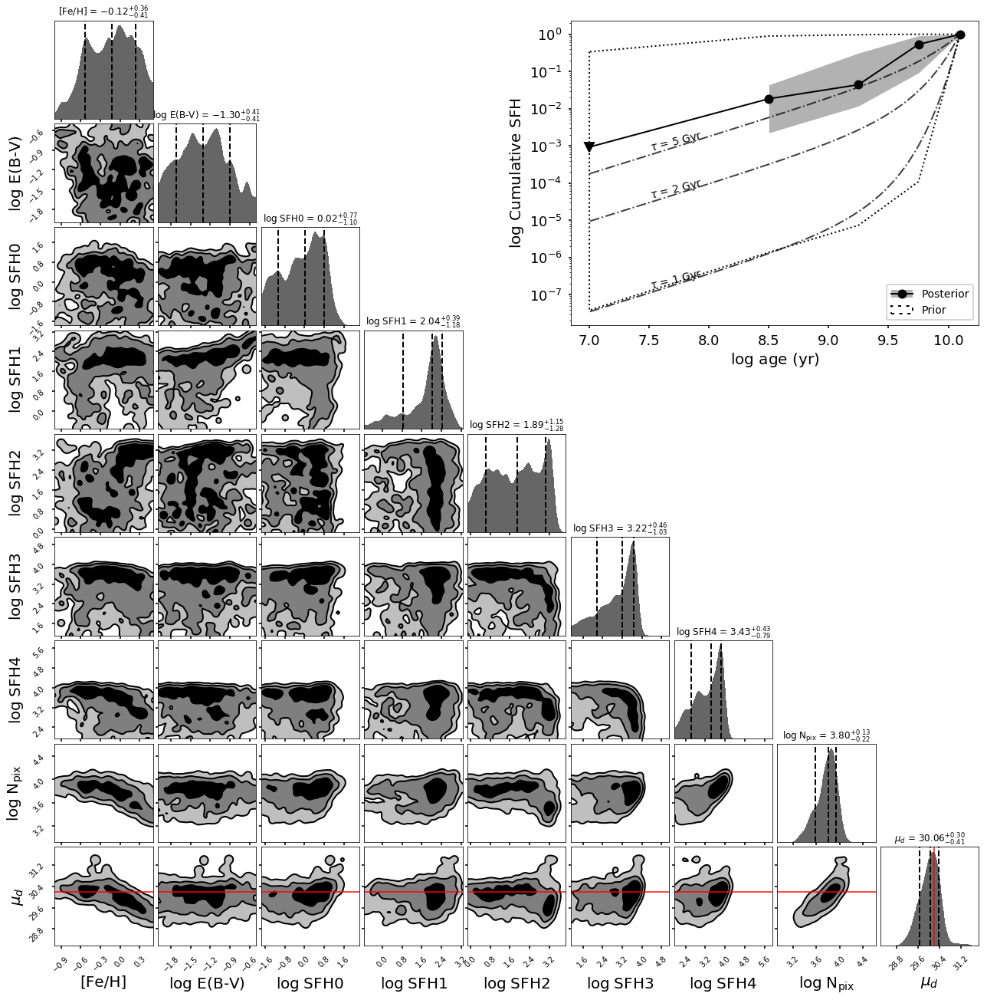

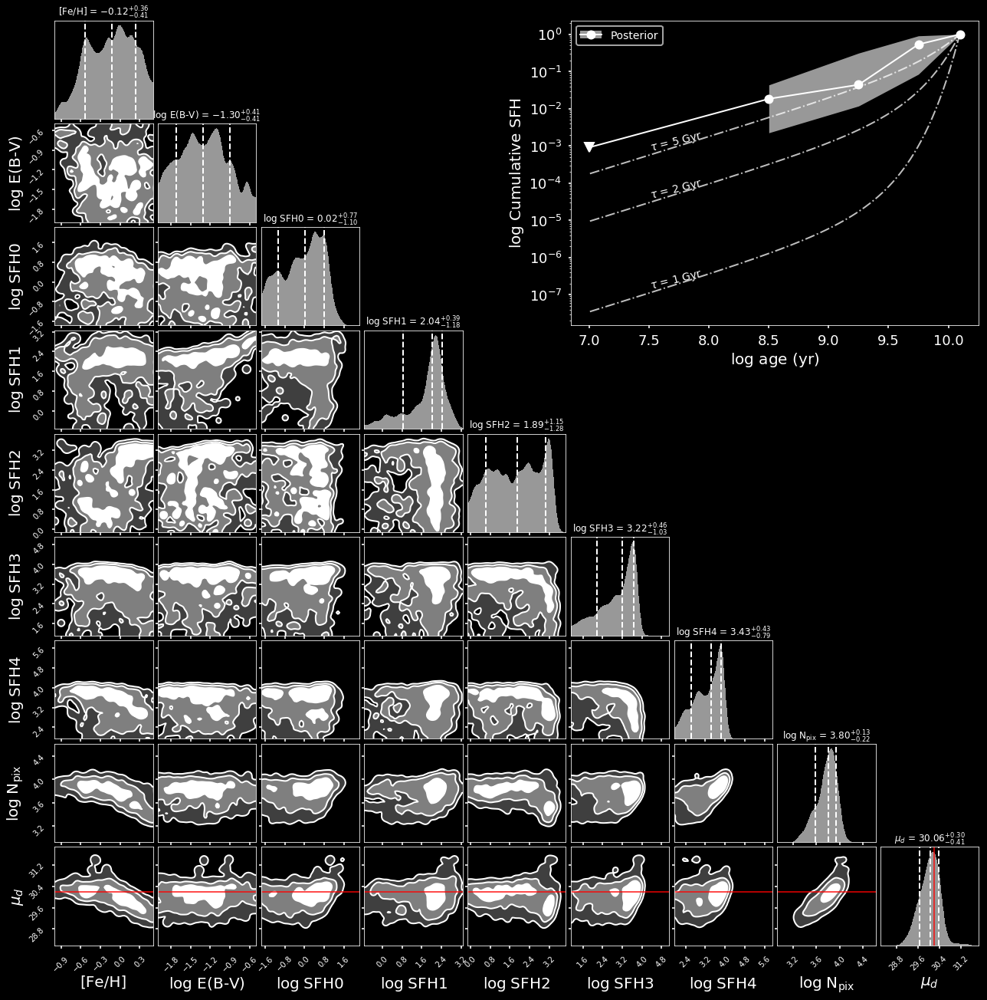

In [17]:
%%savefig_dark_light NGC3377_b_corner.pdf
r = results['NGC3377_b1_m9']
fig, axes, axbig, lines, _, _, _ = r.plot_corner_sfh(cumulative=True, widths=[68.], sfh_kwargs={'dark':is_dark, 'show_prior': (not is_dark), 'show_uppers': True});
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=axbig, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')

# Figure 5 - M87 Corner

Saving light figure as figures/M87v2_c1_corner.pdf
Saving dark figure as figures_dark/M87v2_c1_corner_dark.pdf


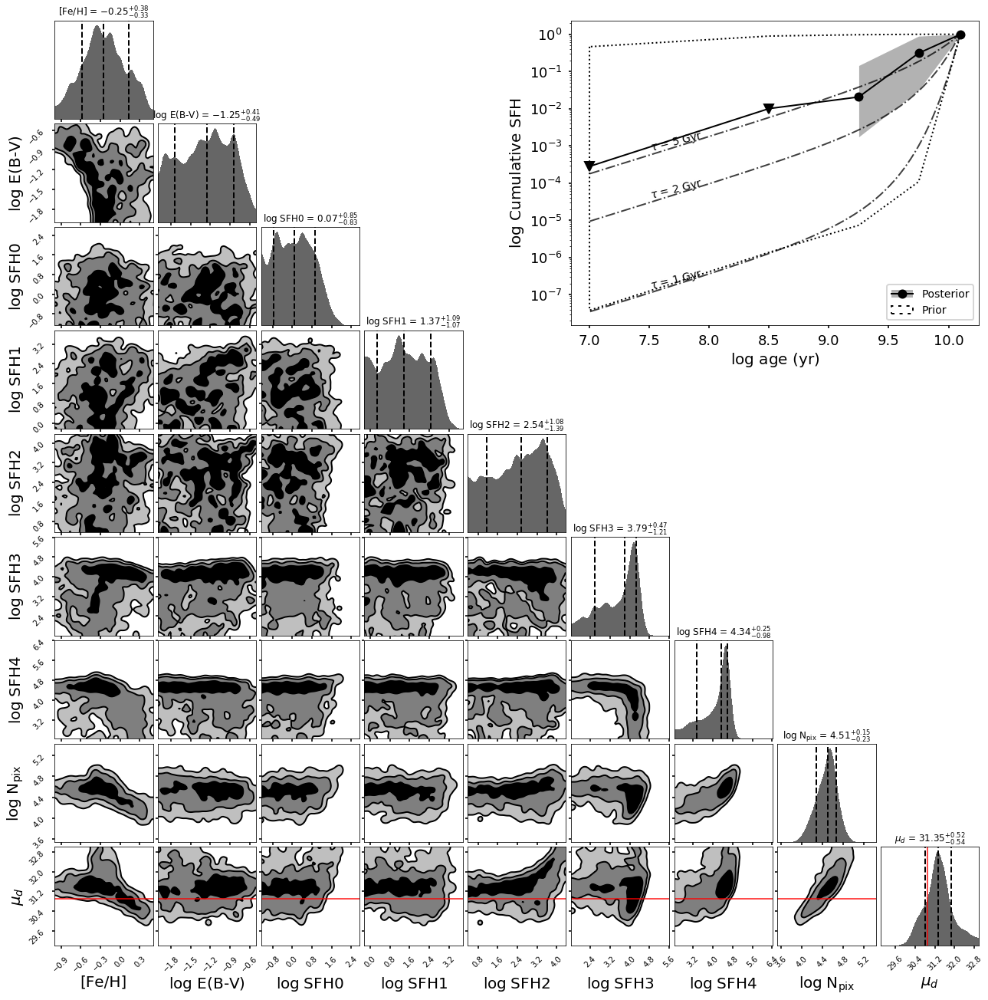

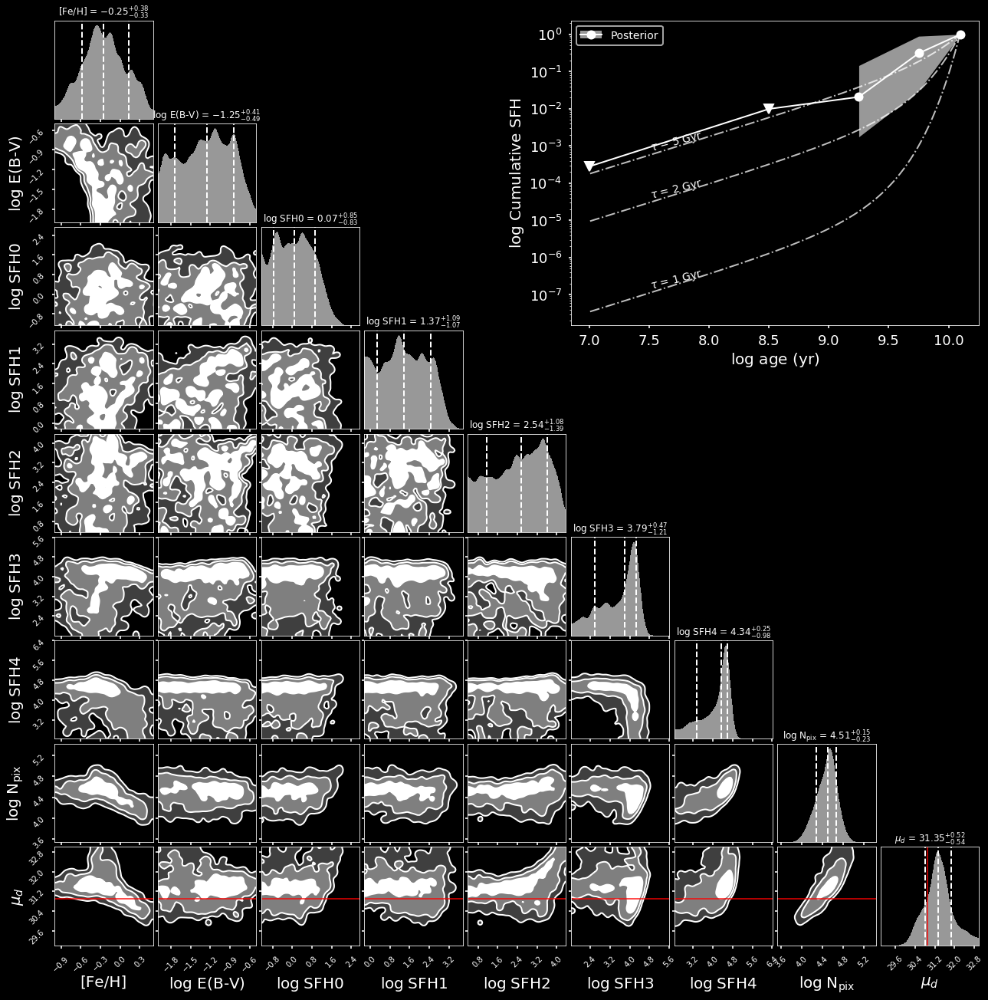

In [18]:
%%savefig_dark_light M87v2_c1_corner.pdf
r = results['M87v2_c1_m9']
fig, axes, axbig, lines, _, _, _ = r.plot_corner_sfh(cumulative=True, widths=[68.], sfh_kwargs={'dark':is_dark, 'show_prior': (not is_dark), 'show_uppers': True});
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=axbig, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')

# Figure 6 - Contours / Residuals

Saving light figure as figures/all_residuals.pdf
Saving dark figure as figures_dark/all_residuals_dark.pdf


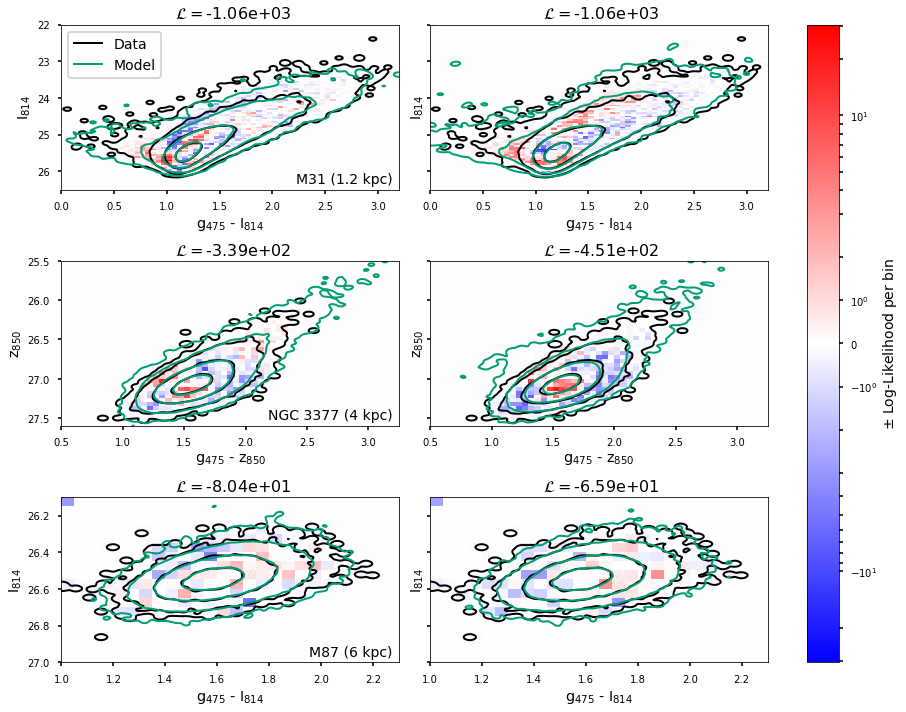

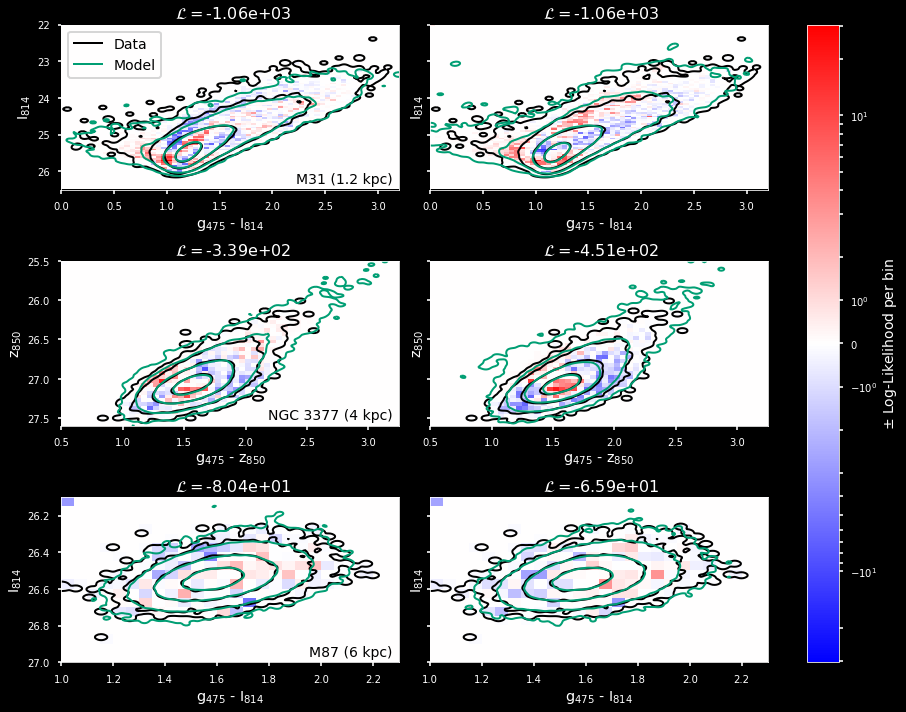

In [22]:
%%savefig_dark_light all_residuals.pdf
fig, axes = plt.subplots(ncols=2, nrows=3, figsize=(12,10), sharex=False, sharey='row')
bins = [np.arange(22.0, 26.51, 0.05), np.arange(0.0, 3.21, 0.05)]
norm = None

_, norm = residuals('M31_e_m9', residual_kwargs={'cbar_kwargs': {'linthresh': 3.}, 'norm': norm}, ax=axes[0,0], bins=bins)
axes[0,0].legend(loc=2, facecolor='w')
for text in axes[0,0].get_legend().get_texts():
    text.set_color("k")
_, norm = residuals('M31_e_m11', residual_kwargs={'norm': norm}, ax=axes[0,1], bins=bins)

bins = [np.arange(25.5, 27.61, 0.05), np.arange(0.5, 3.26, 0.05)]
_, norm = residuals('NGC3377_c1_m9', residual_kwargs={'norm': norm}, ax=axes[1,0], bins=bins)
_, norm = residuals('NGC3377_c1_m11', residual_kwargs={'norm': norm}, ax=axes[1,1], bins=bins)

bins = [np.arange(26.1, 27.01, 0.05), np.arange(1.0, 2.31, 0.05)]
_, norm = residuals('M87v2_c1_m9', residual_kwargs={'norm': norm}, ax=axes[2,0], bins=bins)
_, norm = residuals('M87v2_c1_m11', residual_kwargs={'norm': norm}, ax=axes[2,1], bins=bins)


for g, a in zip(['M31 (1.2 kpc)', 'NGC 3377 (4 kpc)', 'M87 (6 kpc)'], axes[:,0]):
    a.text(0.98, 0.02, g, fontsize=14, horizontalalignment='right', color='k', verticalalignment='bottom', transform=a.transAxes)

fig.tight_layout()
fig.colorbar(axes[0,0].get_images()[0], ax=axes, fraction=0.05, label='$\pm$ Log-Likelihood per bin')

Saving light figure as figures/m31_residual.pdf
Saving dark figure as figures_dark/m31_residual_dark.pdf


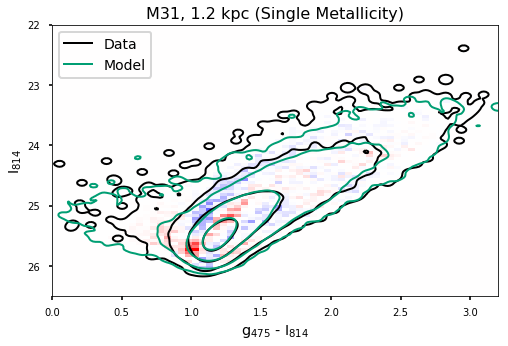

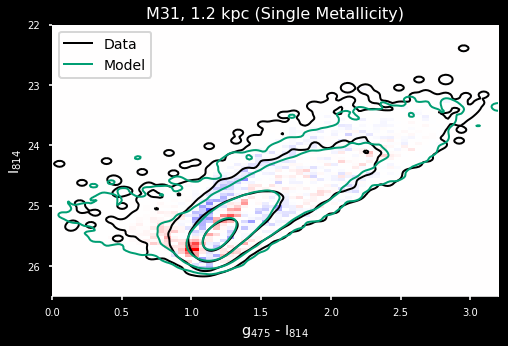

In [20]:
%%savefig_dark_light m31_residual.pdf
bins = [np.arange(22.0, 26.51, 0.05), np.arange(0.0, 3.21, 0.05)]
ax, norm = residuals('M31_e_m9', residual_kwargs={'title': 'M31 (Single Metallicity), '}, bins=bins)
ax.set_title('M31, 1.2 kpc (Single Metallicity)')
ax.legend(loc=2, facecolor='w')
for text in ax.get_legend().get_texts():
    text.set_color("k")

Saving light figure as figures/m31_residual_mdf.pdf
Saving dark figure as figures_dark/m31_residual_mdf_dark.pdf


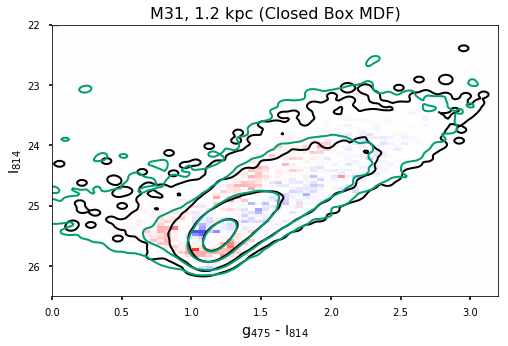

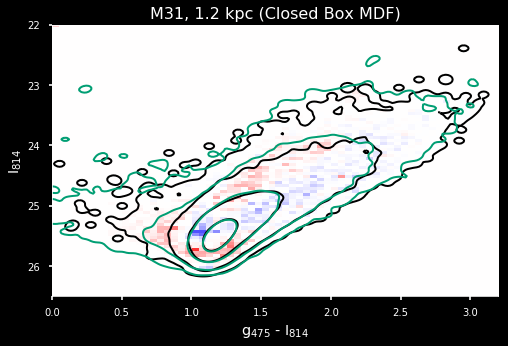

In [21]:
%%savefig_dark_light m31_residual_mdf.pdf
ax, norm = residuals('M31_e_m11', residual_kwargs={'title': 'M31 Closed Box MDF, ', 'norm': norm}, bins=bins)
ax.legend(loc=2, facecolor='w')
ax.set_title('M31, 1.2 kpc (Closed Box MDF)')
ax.get_legend().remove()
# for text in ax.get_legend().get_texts():
#     text.set_color("k")

Saving light figure as figures/m87_residual.pdf
Saving dark figure as figures_dark/m87_residual_dark.pdf


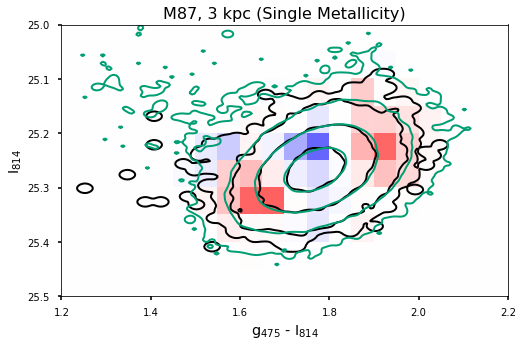

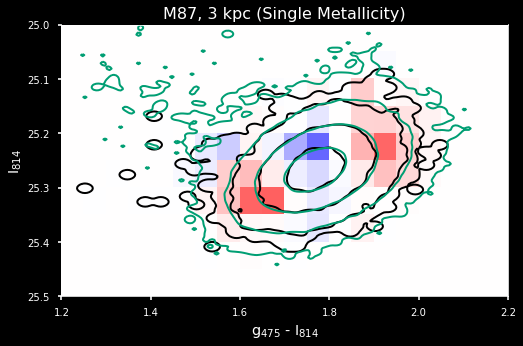

In [22]:
%%savefig_dark_light m87_residual.pdf
bins = [np.arange(25.0, 25.51, 0.05), np.arange(1.2, 2.21, 0.05)]
ax, norm = residuals('M87v2_a1_m9', residual_kwargs={'title': 'M87 Single Metallicity, ', 'norm': norm}, bins=bins)
ax.set_title('M87, 3 kpc (Single Metallicity)')
# ax.set_xlim([1.4, 2.1])
# ax.set_ylim([25.49, 25.0])

Saving light figure as figures/m87_residual_mdf.pdf
Saving dark figure as figures_dark/m87_residual_mdf_dark.pdf


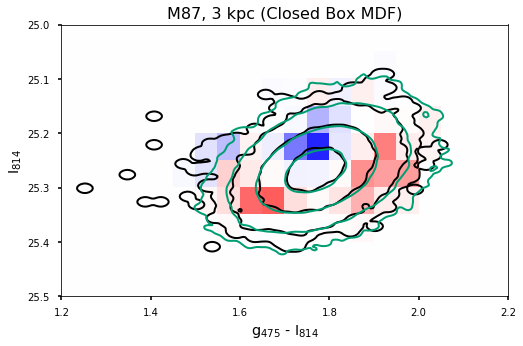

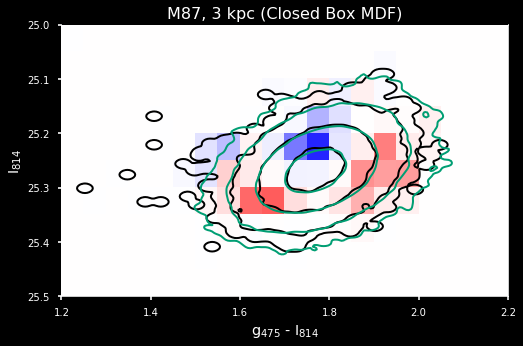

In [23]:
%%savefig_dark_light m87_residual_mdf.pdf
ax, norm = residuals('M87v2_a1_m11', residual_kwargs={'title': 'M87 Closed Box MDF, ', 'norm': norm}, bins=bins)
ax.set_title('M87, 3 kpc (Closed Box MDF)')
# ax.set_xlim([1.4, 2.1])
# ax.set_ylim([25.49, 25.0])

In [24]:
radii_kpc['NGC3377_c1_m9']

3.9356087175621868

Saving light figure as figures/NGC3377_residual.pdf
Saving dark figure as figures_dark/NGC3377_residual_dark.pdf


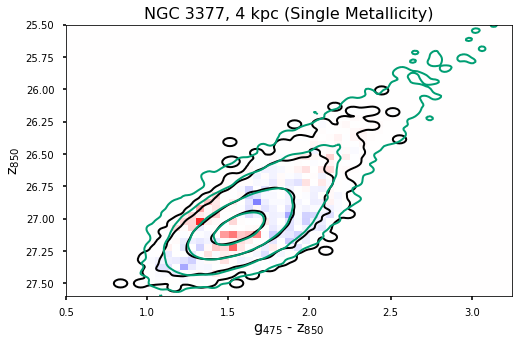

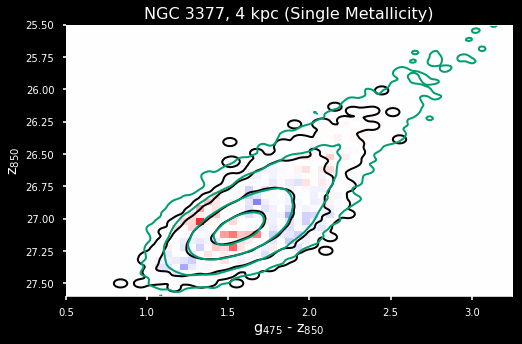

In [25]:
%%savefig_dark_light NGC3377_residual.pdf
bins = [np.arange(25.5, 27.61, 0.05), np.arange(0.5, 3.26, 0.05)]
ax, norm = residuals('NGC3377_c1_m9', residual_kwargs={'title': 'NGC3377 (Single Metallicity),', 'norm': norm}, bins=bins)
ax.set_title('NGC 3377, 4 kpc (Single Metallicity)')
# ax.set_xlim([1.25, 2.5])
# ax.set_ylim([26.5, 25.0])

Saving light figure as figures/NGC3377_residual_mdf.pdf
Saving dark figure as figures_dark/NGC3377_residual_mdf_dark.pdf


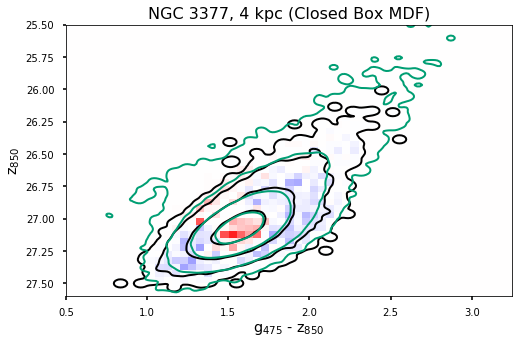

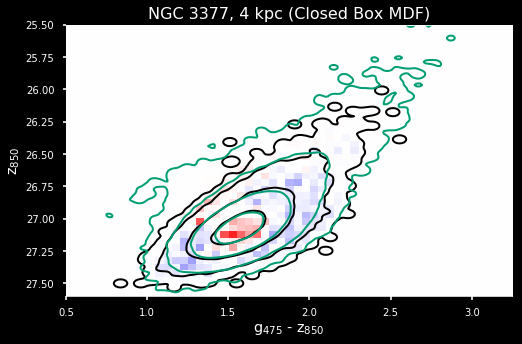

In [26]:
%%savefig_dark_light NGC3377_residual_mdf.pdf
ax, norm = residuals('NGC3377_c1_m11', residual_kwargs={'title': 'NGC3377 (Closed Box MDF),', 'norm': norm}, bins=bins)
ax.set_title('NGC 3377, 4 kpc (Closed Box MDF)')
# ax.set_xlim([1.25, 2.5])
# ax.set_ylim([26.5, 25.0])

Saving light figure as figures/NGC4993_residual.pdf
Saving dark figure as figures_dark/NGC4993_residual_dark.pdf


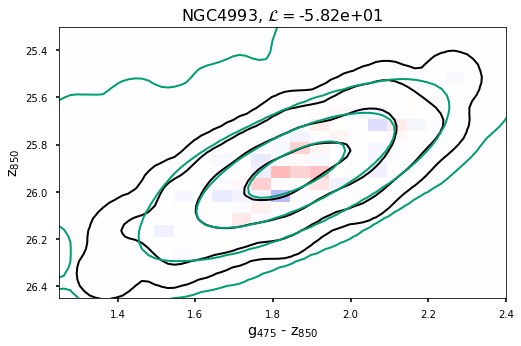

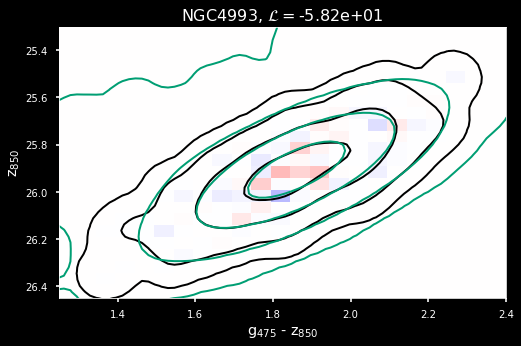

In [27]:
%%savefig_dark_light NGC4993_residual.pdf
ax, norm = residuals('NGC4993_a1_m9', residual_kwargs={'title': 'NGC4993,', 'norm': norm})
ax.set_xlim([1.25, 2.4])
ax.set_ylim([26.45, 25.3])

# Figure 9 - SFHs vs Radius

In [28]:
df_c1 = pd.read_csv('../data/Conroy16_r1.csv', names=['x', 'y'])
df_c1.x += (10.1 - df_c1.x.max())
df_c1

,x,y
0,6.4899,-6.0032
1,7.4949,-4.7700
2,8.2430,-4.0435
3,8.7453,-3.0879
4,9.2470,-1.2887
5,9.7496,-0.6720
6,10.1000,0.0300


In [29]:
df_c02 = pd.read_csv('../data/Conroy16_r02.csv', names=['x', 'y'])
df_c02.x += (10.1 - df_c02.x.max())
df_c02

,x,y
0,7.5032,-5.4411
1,8.2540,-3.0054
2,8.7487,-2.2590
3,9.2515,-2.0895
4,9.7540,-1.3936
5,10.1000,0.0224


## SFH Upper Limits

## M31 SFH

Saving light figure as figures/SFH_M31_conroy_upper.pdf
Saving dark figure as figures_dark/SFH_M31_conroy_upper_dark.pdf


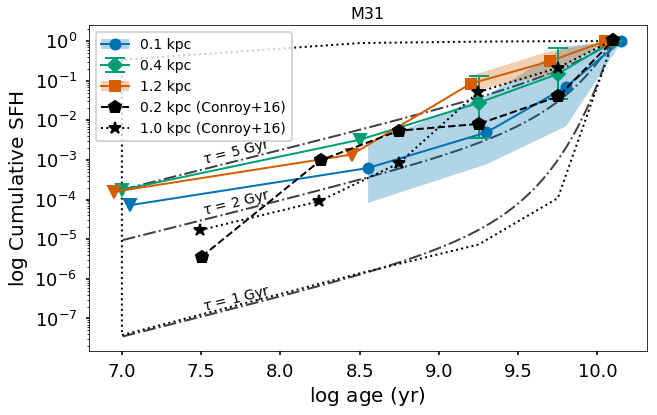

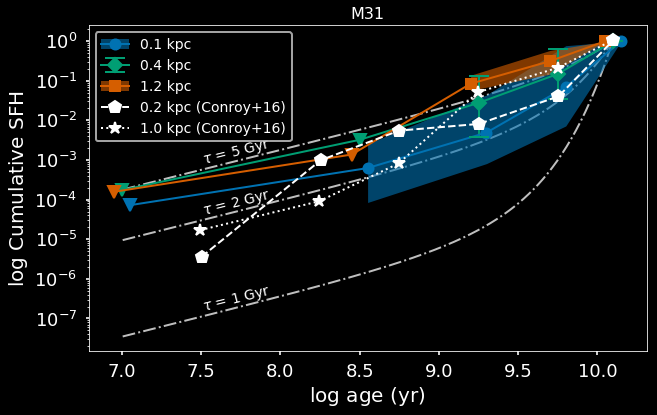

In [53]:
%%savefig_dark_light SFH_M31_conroy_upper.pdf
fig, ax = plt.subplots(figsize=(10,6))
g = 'M31'
lines = {}
for i, r in enumerate(['a', 'c', 'e']):
# for i, r in enumerate(['a', 'b', 'c', 'd', 'e']):
    k = f'{g}_{r}_m9'
    res = results[k]
    ax, lines[k], _, _, _ = res.plot_cum_sfh(xshift=-0.05*(i-1),
        ax=ax, color=colors[i], show_prior=((r=='e') and (not is_dark)),
        show_fill=((i+1)%2), show_bars=(i%2),
        width=68., dark=is_dark, marker=markers[i], show_uppers=True,)
line_c02, = ax.plot(df_c02.x, 10.**df_c02.y, 'p--', label='0.2 kpc (Conroy+16)', color=('w' if is_dark else 'k'))
line_c1, = ax.plot(df_c1.x[1:], 10.**df_c1.y[1:], '*:', label='1.0 kpc (Conroy+16)', color=('w' if is_dark else 'k'))
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[k] for k in lines.keys()]+[line_c02, line_c1], [f'{radii_kpc[k]:.1f} kpc' for k in lines.keys()]+['0.2 kpc (Conroy+16)', '1.0 kpc (Conroy+16)'])
ax.set_title(g)

## M87 SFH

Saving light figure as figures/SFH_M87v2_upper.pdf
Saving dark figure as figures_dark/SFH_M87v2_upper_dark.pdf


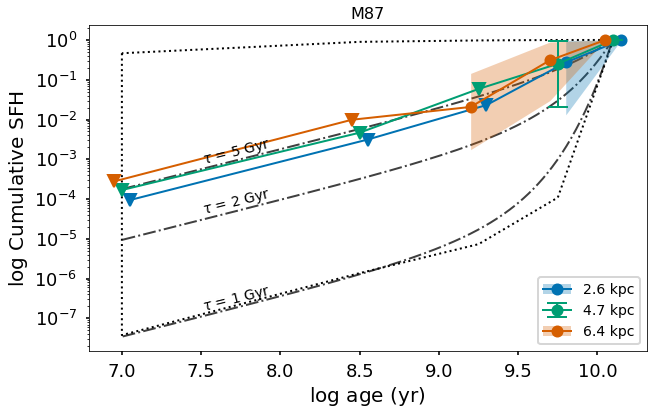

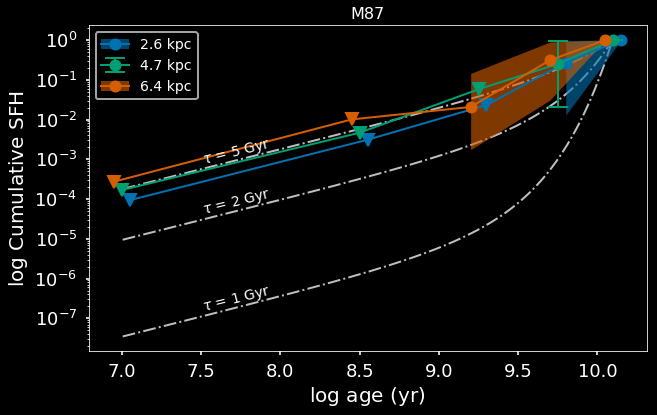

In [54]:
%%savefig_dark_light SFH_M87v2_upper.pdf
fig, ax = plt.subplots(figsize=(10,6))
g = 'M87v2'
lines = {}
for i, r in enumerate(['a1', 'b1', 'c1']):
    k = f'{g}_{r}_m9'
    res = results[k]
    ax, lines[k], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_uppers=True,
                                    xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                    show_prior=((r=='c1') and (not is_dark)), width=68., dark=is_dark, )
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[k] for k in lines.keys()], [f'{radii_kpc[k]:.1f} kpc' for k in lines.keys()])
ax.set_title(g.replace('v2', ''))

Saving light figure as figures/SFH_M87v1.pdf
Saving dark figure as figures_dark/SFH_M87v1_dark.pdf


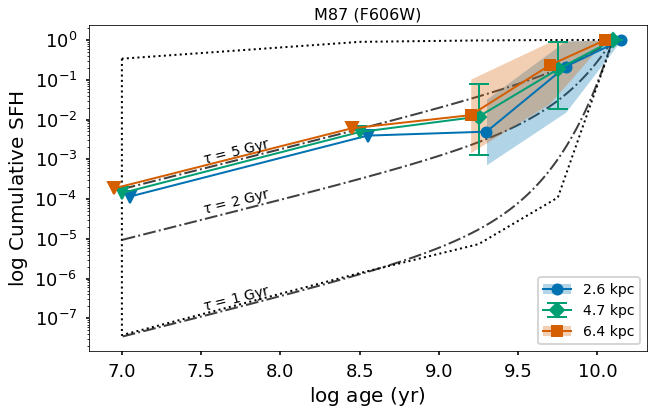

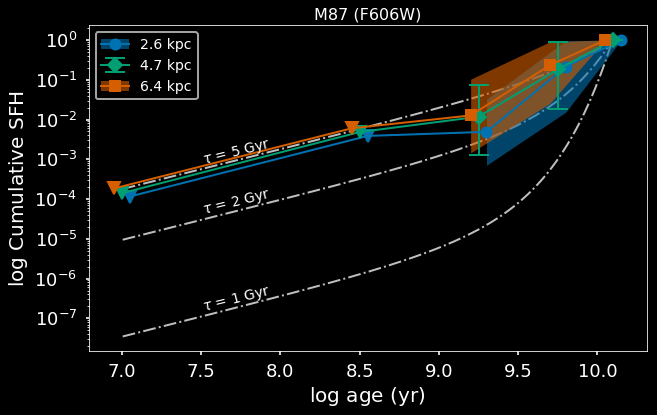

In [55]:
%%savefig_dark_light SFH_M87v1.pdf
fig, ax = plt.subplots(figsize=(10,6))
g = 'M87'
lines = {}
for i, r in enumerate(['a1', 'b1', 'c1']):
    k = f'{g}_{r}_m9'
    res = results[k]
    ax, lines[k], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((r=='c1') and (not is_dark)),
                                             xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                             width=68., dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[k] for k in lines.keys()], [f'{radii_kpc[k]:.1f} kpc' for k in lines.keys()])
ax.set_title(g + " (F606W)")

## M49 SFH

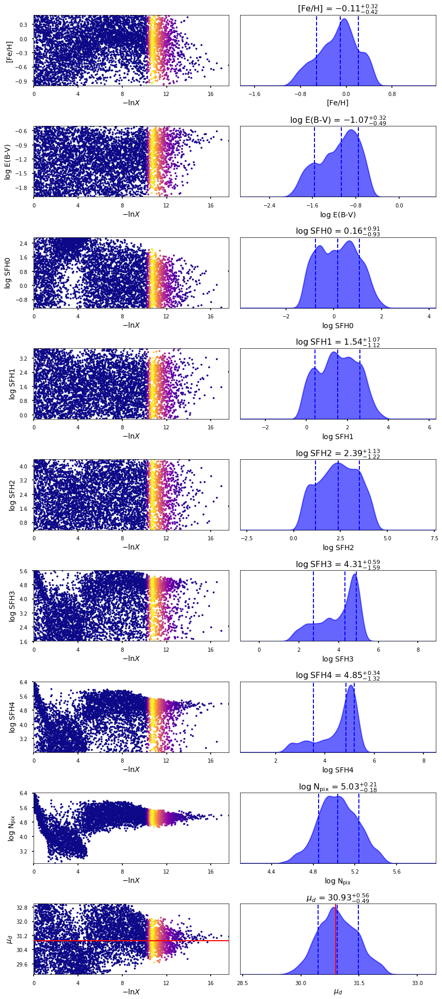

In [128]:
results['M87_a1_m9'].plot_trace();

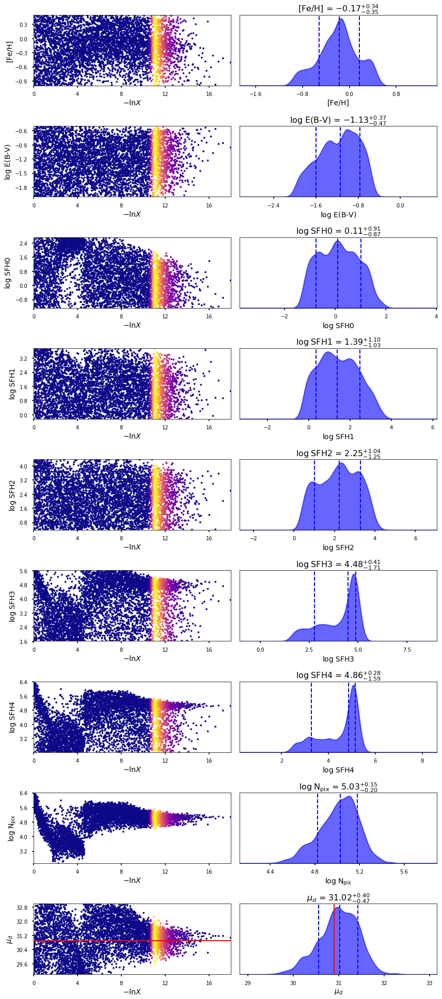

In [129]:
results['M87v2_a1_m9'].plot_trace();

In [130]:
results['M87_a1_m9'].sfr_is_upper()

array([ True,  True, False, False, False])

In [133]:
results['M87_a1_m9'].get_sfr()[2][0] / results['M87_a1_m9'].get_sfr(width=100.)[2][0]

array([ 3.18441749,  4.50858228,  6.11800743, 13.01068014, 12.79677767])

Saving light figure as figures/SFH_M49_upper.pdf
Saving dark figure as figures_dark/SFH_M49_upper_dark.pdf


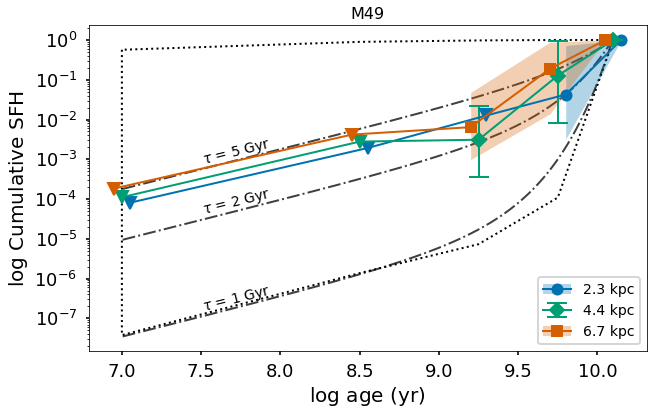

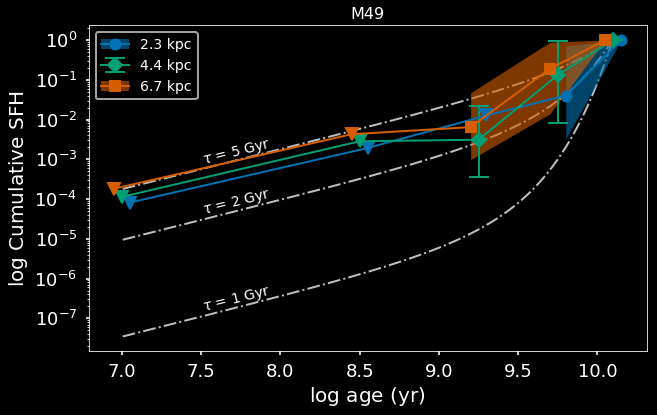

In [121]:
%%savefig_dark_light SFH_M49_upper.pdf
fig, ax = plt.subplots(figsize=(10,6))
g = 'M49'
lines = {}
for i, r in enumerate(['a1', 'b1', 'c1']):
    k = f'{g}_{r}_m9'
    res = results[k]
    ax, lines[k], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((r=='c1') and (not is_dark)), width=68.,
                                    xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                    dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[k] for k in lines.keys()], [f'{radii_kpc[k]:.1f} kpc' for k in lines.keys()])
ax.set_title(g)

## NGC3377 SFH

Saving light figure as figures/SFH_NGC3377_upper.pdf
Saving dark figure as figures_dark/SFH_NGC3377_upper_dark.pdf


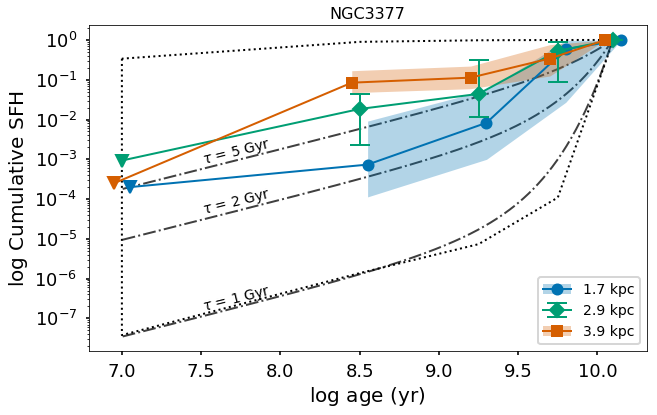

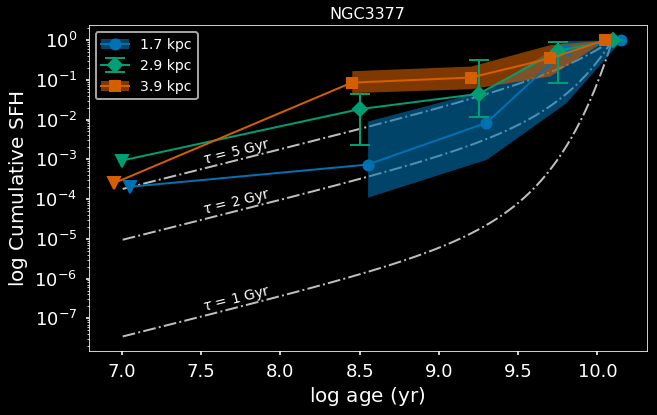

In [57]:
%%savefig_dark_light SFH_NGC3377_upper.pdf
fig, ax = plt.subplots(figsize=(10,6))
g = 'NGC3377'
lines = {}
for i, r in enumerate(['a1', 'b1', 'c1']):
    k = f'{g}_{r}_m9'
    res = results[k]
    ax, lines[k], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((r=='c1') and (not is_dark)),
                                            xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                            width=68., dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[k] for k in lines.keys()], [f'{radii_kpc[k]:.1f} kpc' for k in lines.keys()])
ax.set_title(g)

## NGC4993 SFH

Saving light figure as figures/SFH_NGC4993_upper.pdf
Saving dark figure as figures_dark/SFH_NGC4993_upper_dark.pdf


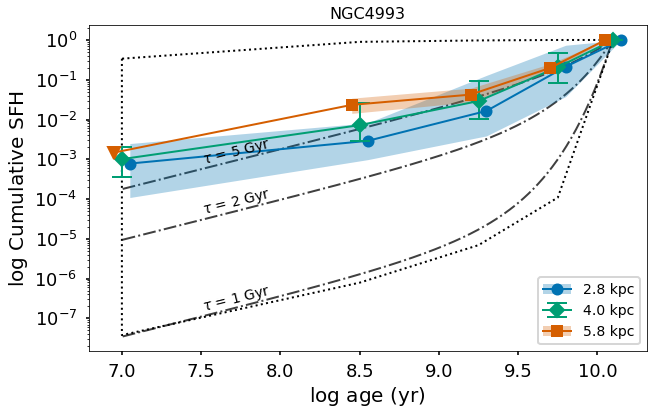

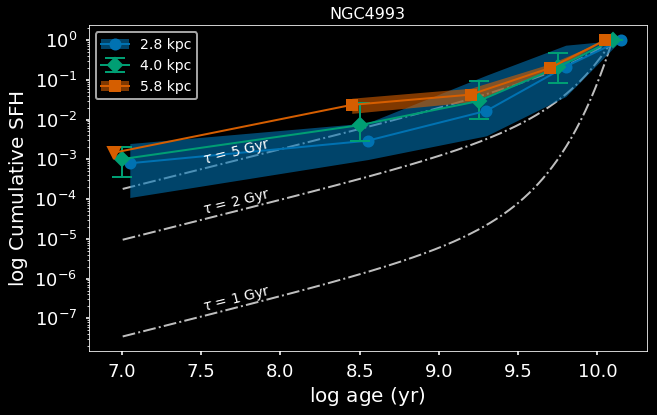

In [58]:
%%savefig_dark_light SFH_NGC4993_upper.pdf
fig, ax = plt.subplots(figsize=(10,6))
g = 'NGC4993'
lines = {}
for i, r in enumerate(['a1', 'b1', 'c1']):
    k = f'{g}_{r}_m9'
    res = results[k]
    ax, lines[k], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((r=='c1') and (not is_dark)),
                                            xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                            width=68., dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[k] for k in lines.keys()], [f'{radii_kpc[k]:.1f} kpc' for k in lines.keys()])
ax.set_title(g)

# SFHs vs Galaxy

In [98]:
compare_colors = {
    'M31': colors[0],
    'NGC3377': colors[2],
    'M87': colors[1],
    'M49': colors[0]
}
compare_markers = {
    'M31': markers[0],
    'NGC3377': markers[2],
    'M87': markers[1],
    'M49': markers[3]
}

Saving light figure as figures/SFH_compare_1kpc_upper.pdf
Saving dark figure as figures_dark/SFH_compare_1kpc_upper_dark.pdf


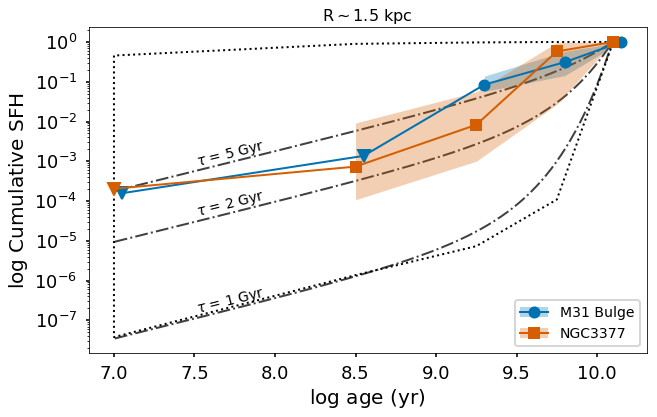

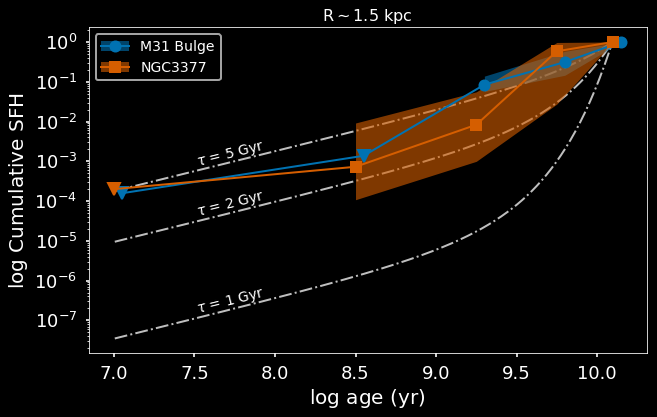

In [99]:
%%savefig_dark_light SFH_compare_1kpc_upper.pdf
fig, ax = plt.subplots(figsize=(10,6))
lines = {}
for i, r in enumerate(['M31_e', 'NGC3377_a1']):
    g = r.split('_')[0]
    k = f'{r}_m9'
    res = results[k]
    ax, lines[g], _, _, _ = res.plot_cum_sfh(ax=ax, color=compare_colors[g], show_prior=((i==1) and (not is_dark)), width=68.,
                                            xshift=-0.05*(i-1),
                                            dark=is_dark, marker=compare_markers[g], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[g] for g in lines.keys()], [g.replace('M31', 'M31 Bulge') for g in lines.keys()])
ax.set_title(r'R$\sim$1.5 kpc')

Saving light figure as figures/SFH_compare_4kpc_upper.pdf
Saving dark figure as figures_dark/SFH_compare_4kpc_upper_dark.pdf


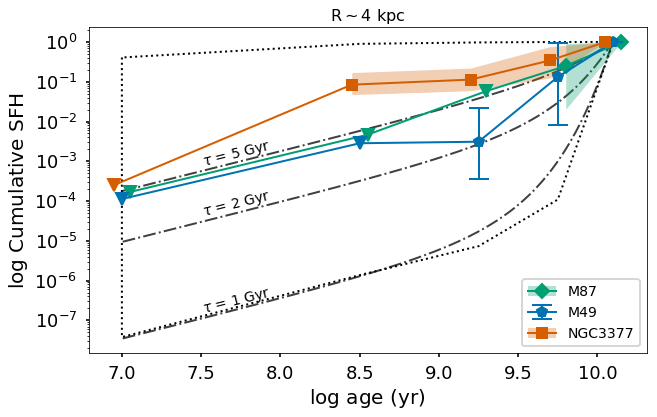

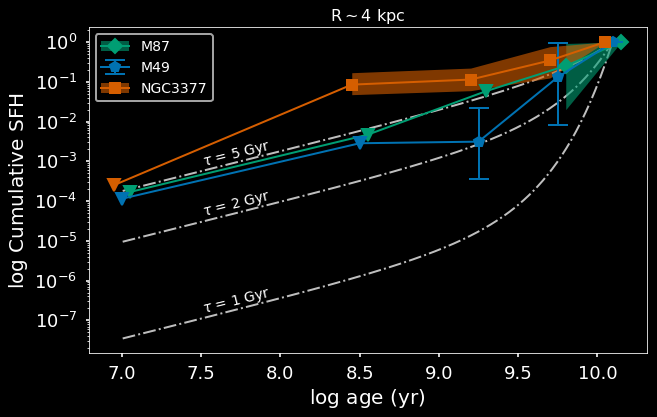

In [100]:
%%savefig_dark_light SFH_compare_4kpc_upper.pdf
fig, ax = plt.subplots(figsize=(10,6))
lines = {}
for i, r in enumerate(['M87v2_b1', 'M49_b1', 'NGC3377_c1']):
    g = r.split('_')[0].replace('v2','')
    k = f'{r}_m9'
    res = results[k]
    ax, lines[g], _, _, _ = res.plot_cum_sfh(ax=ax, color=compare_colors[g], show_prior=((i==1) and (not is_dark)), width=68.,
                                            xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                            dark=is_dark, marker=compare_markers[g], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[g] for g in lines.keys()], [f'{g}' for g in lines.keys()])
ax.set_title(r'R$\sim$4 kpc')

Saving light figure as figures/SFH_compare_7kpc_upper.pdf
Saving dark figure as figures_dark/SFH_compare_7kpc_upper_dark.pdf


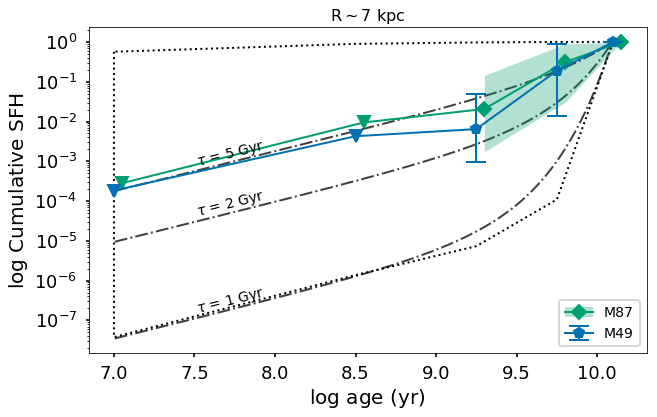

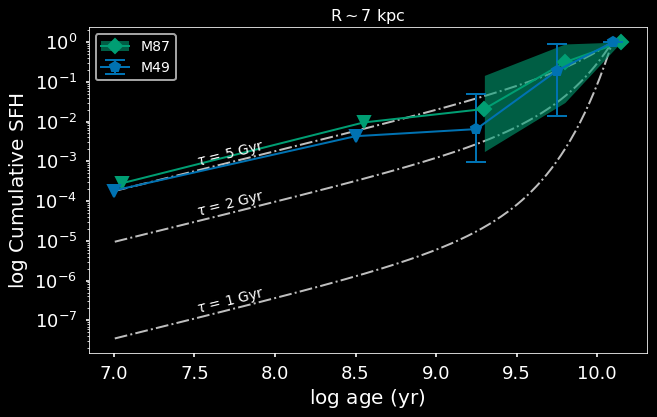

In [101]:
%%savefig_dark_light SFH_compare_7kpc_upper.pdf
fig, ax = plt.subplots(figsize=(10,6))
lines = {}
for i, r in enumerate(['M87v2_c1', 'M49_c1']):
    g = r.split('_')[0].replace('v2','')
    k = f'{r}_m9'
    res = results[k]
    ax, lines[g], _, _, _ = res.plot_cum_sfh(ax=ax, color=compare_colors[g], show_prior=((i==1) and (not is_dark)),
                                    xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                    width=68., dark=is_dark, marker=compare_markers[g], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[g] for g in lines.keys()], [f'{g}' for g in lines.keys()])
ax.set_title(r'R$\sim$7 kpc')

# Compare Quadrants

Saving light figure as figures/SFH_quads_a.pdf
Saving dark figure as figures_dark/SFH_quads_a_dark.pdf


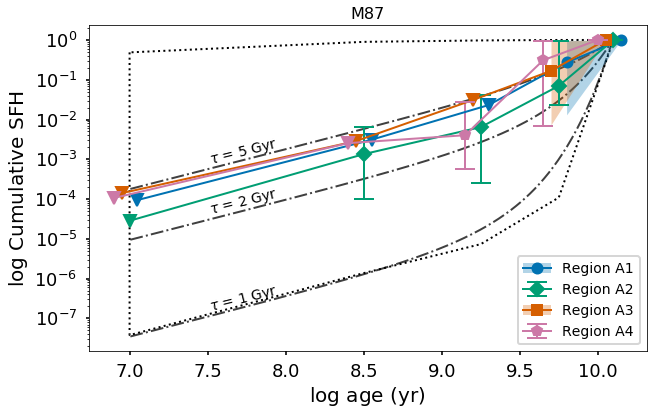

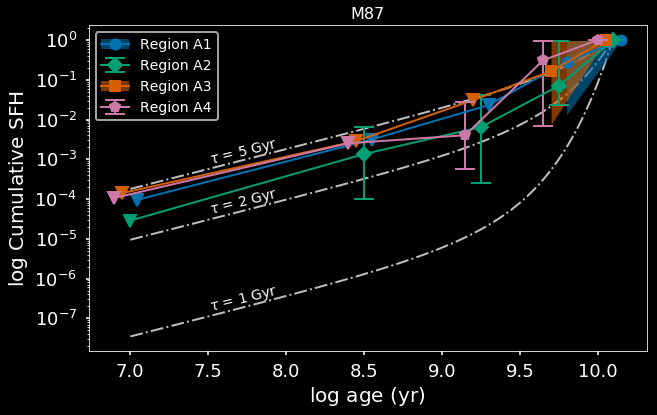

In [63]:
%%savefig_dark_light SFH_quads_a.pdf
fig, ax = plt.subplots(figsize=(10,6))
g = 'M87v2'
lines = {}
for i, r in enumerate(['a1', 'a2', 'a3', 'a4']):
    k = f'{g}_{r}_m9'
    res = results[k]
    ax, lines[i], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((i==1) and (not is_dark)),
                                    xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                    width=68., dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[i] for i in lines.keys()], [f'Region A{i+1}' for i in lines.keys()])
ax.set_title(r'M87')

Saving light figure as figures/SFH_quads_b.pdf
Saving dark figure as figures_dark/SFH_quads_b_dark.pdf


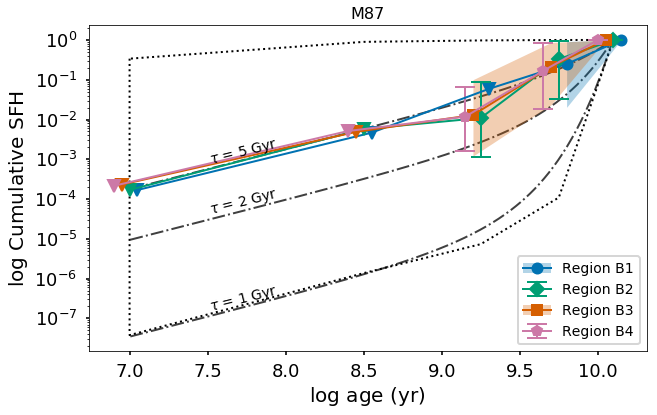

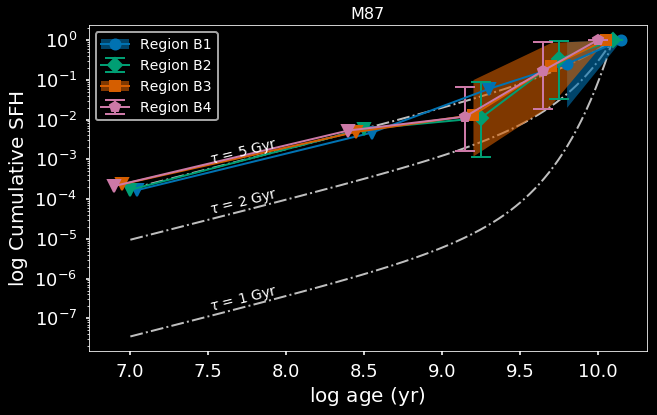

In [64]:
%%savefig_dark_light SFH_quads_b.pdf
fig, ax = plt.subplots(figsize=(10,6))
g = 'M87v2'
lines = {}
for i, r in enumerate(['b1', 'b2', 'b3', 'b4']):
    k = f'{g}_{r}_m9'
    res = results[k]
    ax, lines[i], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((i==1) and (not is_dark)),
                                    xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                    width=68., dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[i] for i in lines.keys()], [f'Region B{i+1}' for i in lines.keys()])
ax.set_title(r'M87')

Saving light figure as figures/SFH_quads_c.pdf
Saving dark figure as figures_dark/SFH_quads_c_dark.pdf


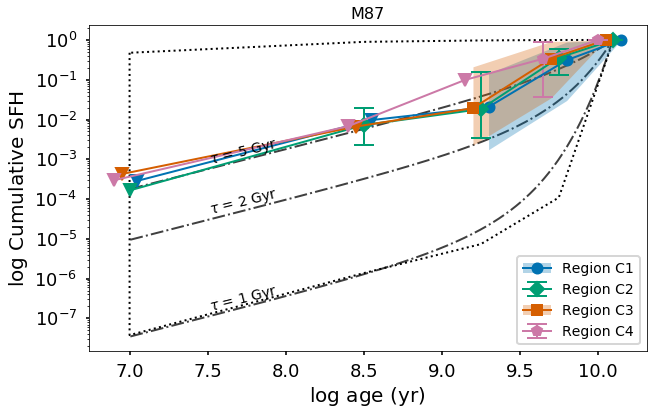

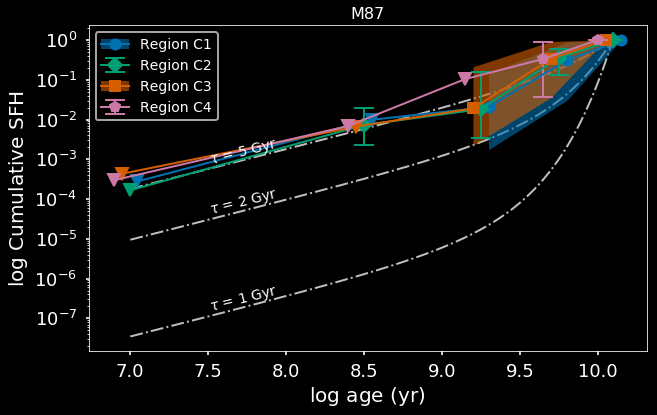

In [65]:
%%savefig_dark_light SFH_quads_c.pdf
fig, ax = plt.subplots(figsize=(10,6))
g = 'M87v2'
lines = {}
for i, r in enumerate(['c1', 'c2', 'c3', 'c4']):
    k = f'{g}_{r}_m9'
    res = results[k]
    ax, lines[i], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((i==1) and (not is_dark)),
                                    xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                    width=68., dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[i] for i in lines.keys()], [f'Region C{i+1}' for i in lines.keys()])
ax.set_title(r'M87')

# Compare Models

Saving light figure as figures/SFH_compare_m31_a_upper.pdf
Saving dark figure as figures_dark/SFH_compare_m31_a_upper_dark.pdf


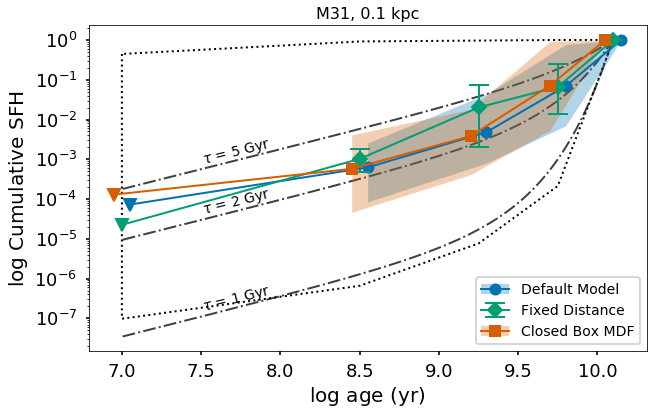

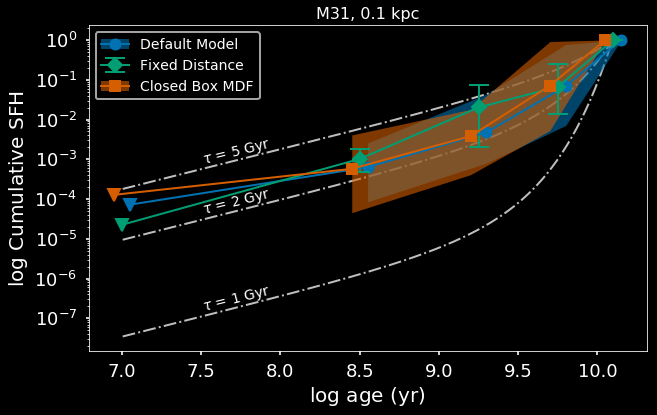

In [66]:
%%savefig_dark_light SFH_compare_m31_a_upper.pdf
models = {
    9: 'Default Model',
    10: 'Fixed Distance',
    11: 'Closed Box MDF',
    12: r'$\tau$ SFH'
}
fig, ax = plt.subplots(figsize=(10,6))
g = 'M31_a'
lines = {}
for i, m in enumerate([9, 10, 11]):
    k = f'{g}_m{m}'
    res = results[k]
    ax, lines[m], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((i==1) and (not is_dark)),
                                            xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                            width=68., dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[m] for m in lines.keys()], [models[m] for m in lines.keys()])
ax.set_title(r'M31, 0.1 kpc')

Saving light figure as figures/SFH_compare_m31_c_upper.pdf
Saving dark figure as figures_dark/SFH_compare_m31_c_upper_dark.pdf


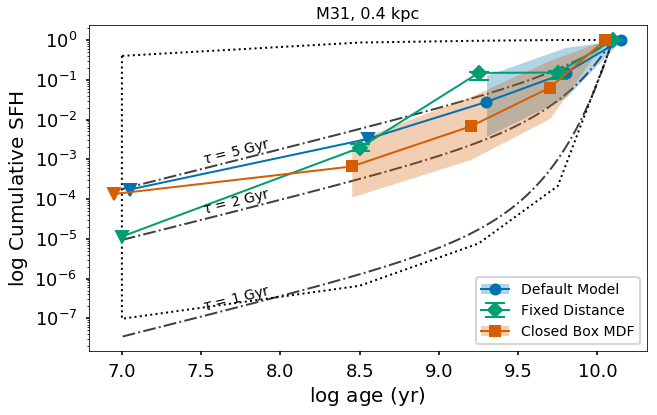

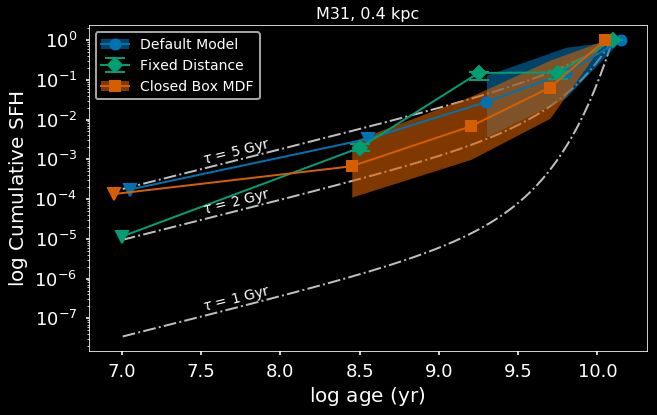

In [67]:
%%savefig_dark_light SFH_compare_m31_c_upper.pdf
models = {
    9: 'Default Model',
    10: 'Fixed Distance',
    11: 'Closed Box MDF',
    12: r'$\tau$ SFH'
}
fig, ax = plt.subplots(figsize=(10,6))
g = 'M31_c'
lines = {}
for i, m in enumerate([9, 10, 11]):
    k = f'{g}_m{m}'
    res = results[k]
    ax, lines[m], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((i==1) and (not is_dark)),
                                            xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                            width=68., dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[m] for m in lines.keys()], [models[m] for m in lines.keys()])
ax.set_title(r'M31, 0.4 kpc')

Saving light figure as figures/SFH_compare_m31_upper.pdf
Saving dark figure as figures_dark/SFH_compare_m31_upper_dark.pdf


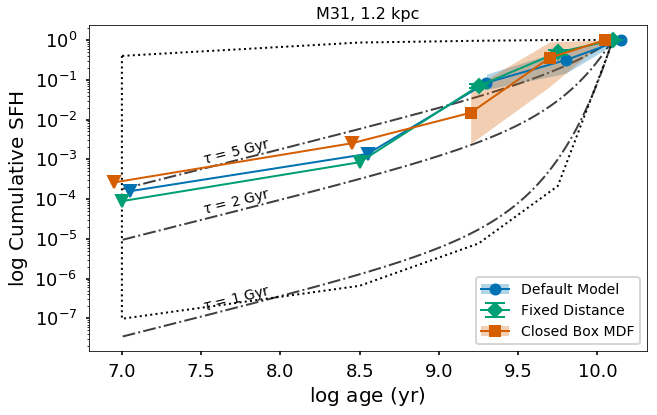

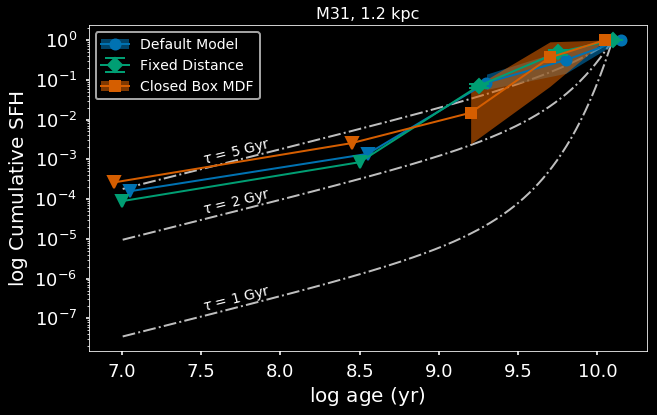

In [68]:
%%savefig_dark_light SFH_compare_m31_upper.pdf
models = {
    9: 'Default Model',
    10: 'Fixed Distance',
    11: 'Closed Box MDF',
    12: r'$\tau$ SFH'
}
fig, ax = plt.subplots(figsize=(10,6))
g = 'M31_e'
lines = {}
for i, m in enumerate([9, 10, 11]):
    k = f'{g}_m{m}'
    res = results[k]
    ax, lines[m], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((i==1) and (not is_dark)),
                                            xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                            width=68., dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[m] for m in lines.keys()], [models[m] for m in lines.keys()])
ax.set_title(r'M31, 1.2 kpc')

Saving light figure as figures/SFH_compare_M87_upper.pdf
Saving dark figure as figures_dark/SFH_compare_M87_upper_dark.pdf


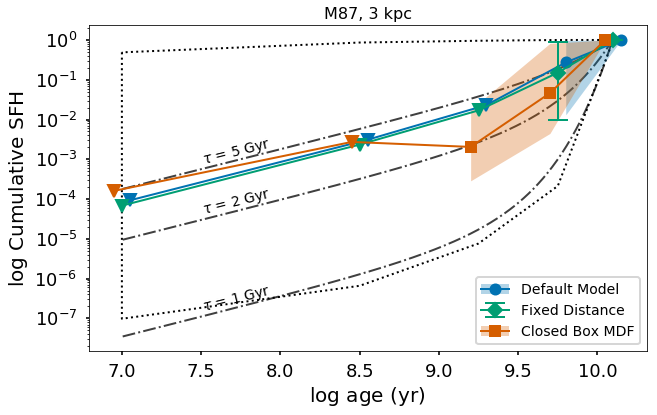

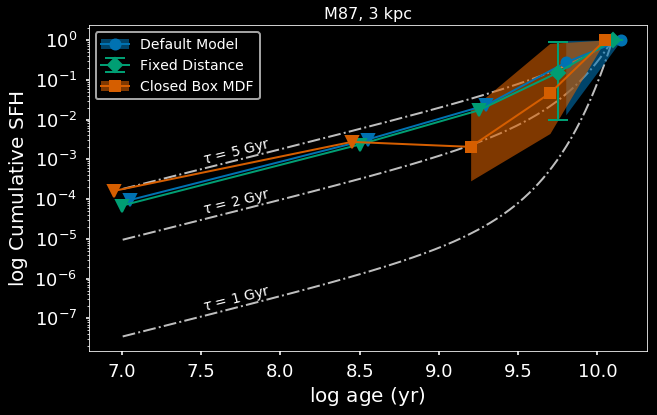

In [70]:
%%savefig_dark_light SFH_compare_M87_upper.pdf
models = {
    7: 'Old Model',
    9: 'Default Model',
    10: 'Fixed Distance',
    11: 'Closed Box MDF',
    12: r'$\tau$ SFH'
}
fig, ax = plt.subplots(figsize=(10,6))
g = 'M87v2_a1'
lines = {}
for i, m in enumerate([9, 10, 11]):
    k = f'{g}_m{m}'
    res = results[k]
    ax, lines[m], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((i==1) and (not is_dark)), width=68.,
                                            xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                            dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[m] for m in lines.keys()], [models[m] for m in lines.keys()])
ax.set_title(r'M87, 3 kpc')

Saving light figure as figures/SFH_compare_NGC3377_c_upper.pdf
Saving dark figure as figures_dark/SFH_compare_NGC3377_c_upper_dark.pdf


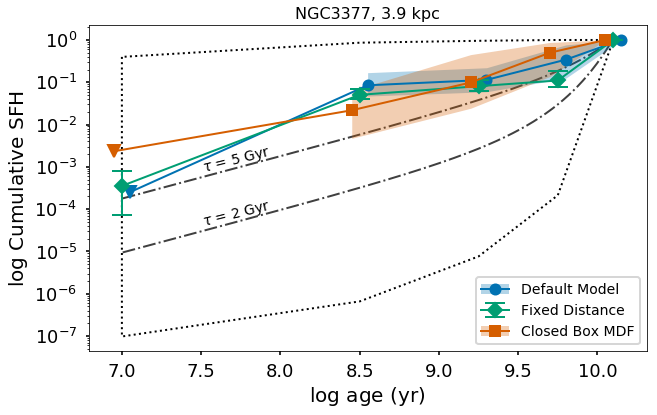

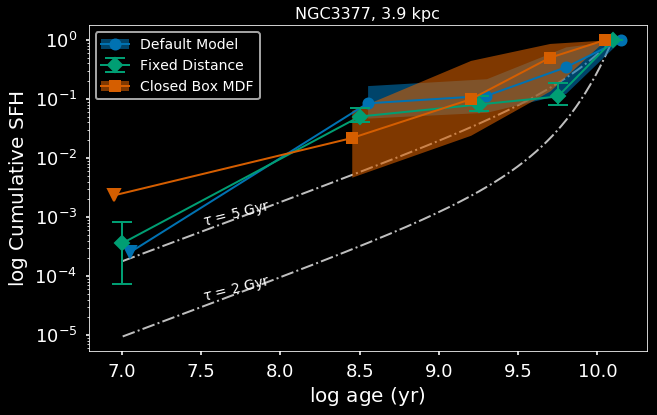

In [71]:
%%savefig_dark_light SFH_compare_NGC3377_c_upper.pdf
models = {
    9: 'Default Model',
    10: 'Fixed Distance',
    11: 'Closed Box MDF',
    12: r'$\tau$ SFH'
}
fig, ax = plt.subplots(figsize=(10,6))
g = 'NGC3377_c1'
lines = {}
for i, m in enumerate([9, 10, 11]):
    k = f'{g}_m{m}'
    res = results[k]
    ax, lines[m], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((i==1) and (not is_dark)),
                                            xshift=-0.05*(i-1), show_bars=(i%2), show_fill=((i+1)%2),
                                            width=68., dark=is_dark, marker=markers[i], show_uppers=True)
for t in [2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[m] for m in lines.keys()], [models[m] for m in lines.keys()])
ax.set_title(r'NGC3377, 3.9 kpc')

# Compare Filters

Saving light figure as figures/M87_compare_filters_upper.pdf
Saving dark figure as figures_dark/M87_compare_filters_upper_dark.pdf


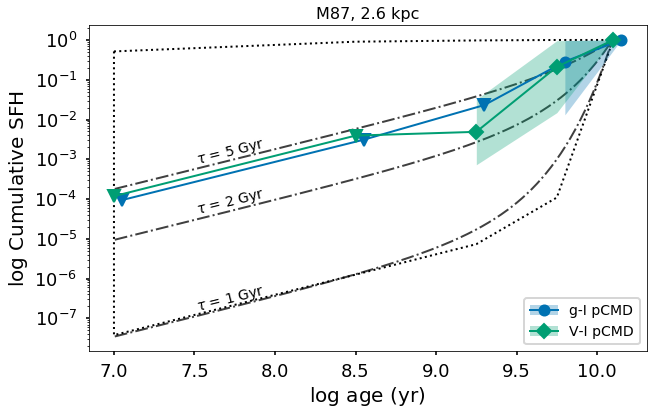

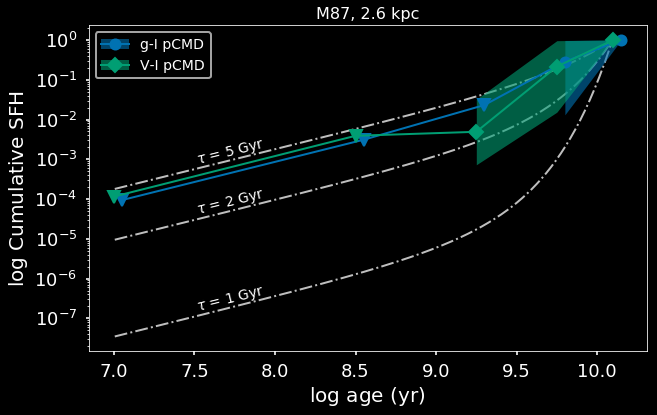

In [92]:
%%savefig_dark_light M87_compare_filters_upper.pdf
fig, ax = plt.subplots(figsize=(10,6))
lines = {}
for i, g in enumerate(['M87v2', 'M87']):
    k = f'{g}_a1_m9'
    res = results[k]
    ax, lines[g], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((i==1) and (not is_dark)), width=68.,
                                             xshift=-0.05*(i-1),
                                             dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[g] for g in ['M87v2', 'M87']], ['g-I pCMD', 'V-I pCMD'])
ax.set_title('M87, 2.6 kpc')

Saving light figure as figures/M87_compare_filters_upper.pdf
Saving dark figure as figures_dark/M87_compare_filters_upper_dark.pdf


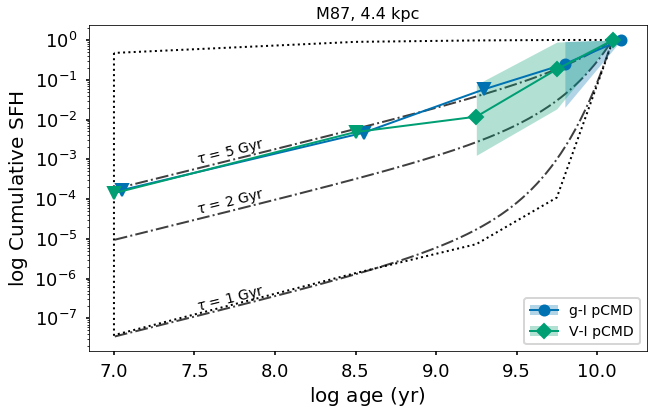

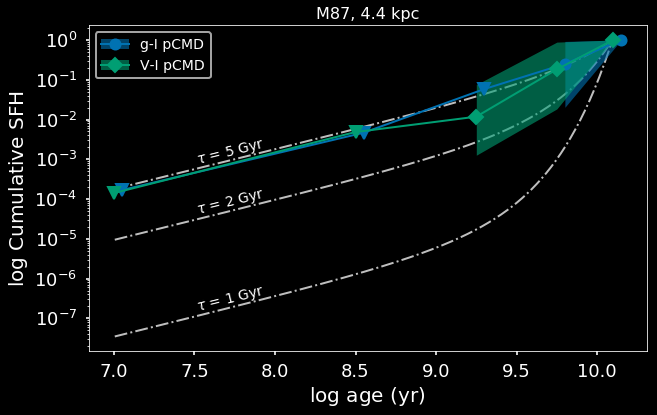

In [91]:
%%savefig_dark_light M87_compare_filters_upper.pdf
fig, ax = plt.subplots(figsize=(10,6))
lines = {}
for i, g in enumerate(['M87v2', 'M87']):
    k = f'{g}_b1_m9'
    res = results[k]
    ax, lines[g], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((i==1) and (not is_dark)), width=68.,
                                             xshift=-0.05*(i-1),
                                             dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[g] for g in ['M87v2', 'M87']], ['g-I pCMD', 'V-I pCMD'])
ax.set_title('M87, 4.4 kpc')

Saving light figure as figures/M87_compare_filters_upper.pdf
Saving dark figure as figures_dark/M87_compare_filters_upper_dark.pdf


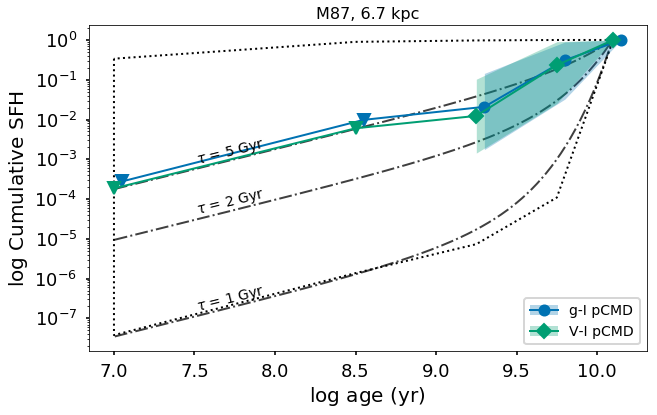

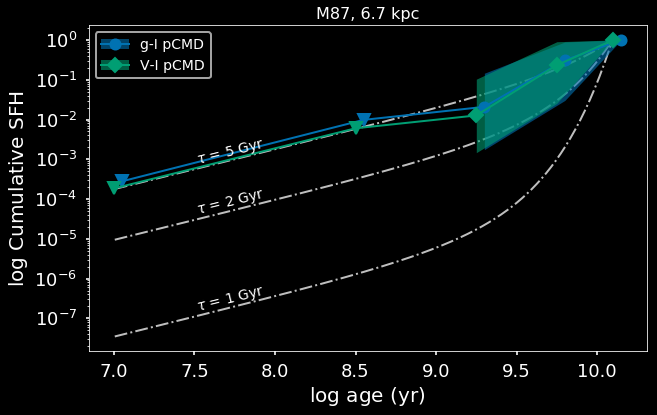

In [90]:
%%savefig_dark_light M87_compare_filters_upper.pdf
fig, ax = plt.subplots(figsize=(10,6))
lines = {}
for i, g in enumerate(['M87v2', 'M87']):
    k = f'{g}_c1_m9'
    res = results[k]
    ax, lines[g], _, _, _ = res.plot_cum_sfh(ax=ax, color=colors[i], show_prior=((i==1) and (not is_dark)), width=68.,
                                             xshift=-0.05*(i-1),
                                             dark=is_dark, marker=markers[i], show_uppers=True)
for t in [1., 2., 5.]:
    plot_tau_cumulative(t, ax=ax, alpha=.75, color=('w' if is_dark else 'k'), zorder=-1, lw=2., ls='-.')
ax.legend([lines[g] for g in ['M87v2', 'M87']], ['g-I pCMD', 'V-I pCMD'])
ax.set_title('M87, 6.7 kpc')

# Age Gradient

In [15]:
def massfracs(key, age=9.0):
    fracs = []
    model = results[key].best_model.copy()
    for v in results[key].equal_samples:
        model.set_params(v[results[key].model_params_idx])
        sfm = model.sfh_model
        fracs.append(sfm.SFH[sfm.ages < age].sum() / sfm.Npix)
    return np.array(fracs)

100%|██████████| 4/4 [00:28<00:00,  7.18s/it]
Saving light figure as figures/young_grads.pdf
100%|██████████| 4/4 [00:31<00:00,  7.80s/it]
Saving dark figure as figures_dark/young_grads_dark.pdf


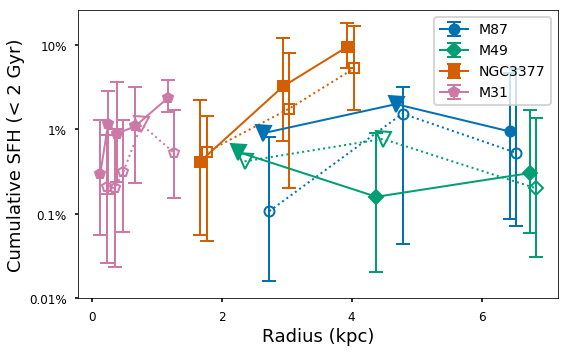

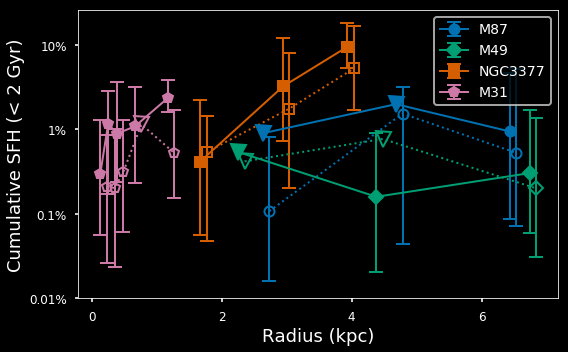

In [16]:
%%savefig_dark_light young_grads.pdf
fig, ax = plt.subplots(figsize=(8,5))
w  = 68.
age = 9.3
for i, g in enumerate(tqdm(['M87v2', 'M49', 'NGC3377', 'M31'])):
    if g in ['M31', 'M51']:
        rs = ['a', 'b', 'c', 'd', 'e']
    else:
        rs = ['a1', 'b1', 'c1']
    for j, m in enumerate([9, 11]):
        xs = []
        ys = []
        for r in rs:
            k = f'{g}_{r}_m{m}'
            if k not in results:
                continue
            fracs = np.log10(massfracs(k, age=age))
            x = radii_kpc[k] + (0.1 if m==11 else 0.0)
            xs.append(x)
            if results[k].sfr_is_upper()[2]:
                y = np.percentile(fracs, 50.+0.5*(68.))
                yerr = None
                marker = 'v'
                ms = 15
            else:
                y = np.median(fracs)
                yerr = [[y - np.percentile(fracs, 50.-.5*w)], 
                        [np.percentile(fracs, 50.+.5*w) - y]]
                marker = markers[i]
                ms = (20 if markers[i] in ['*'] else 10)
            ys.append(y)
            ax.errorbar(x, y, yerr=yerr, marker=marker, color=colors[i], markersize=ms,
                        label=(g.replace('v2','') if  (r==rs[-1] and m==9) else None), mfc=('None' if m==11 else colors[i]),
                        capsize=7)
        xs, ys = np.array(xs)[np.argsort(xs)], np.array(ys)[np.argsort(xs)]
        ax.plot(xs, ys, ls=(':' if m==11 else '-'), marker='', color=colors[i])

ax.set_yticks([-4.0, -3.0, -2.0, -1.0])
ax.set_yticklabels(['0.01%', '0.1%', '1%', '10%'], fontsize=12)
ax.set_ylabel('Cumulative SFH (< 2 Gyr)', fontsize=18)
ax.set_xlabel(r'Radius (kpc)', fontsize=18)
ax.set_xticks([0, 2, 4, 6])
ax.set_xticklabels([0, 2, 4, 6], fontsize=12)
ax.legend(loc=0)
fig.tight_layout()

# Figure 8 - Distance Errors

100%|██████████| 4/4 [00:04<00:00,  1.22s/it]
Saving light figure as figures/dmod_agreement.pdf
100%|██████████| 4/4 [00:04<00:00,  1.21s/it]
Saving dark figure as figures_dark/dmod_agreement_dark.pdf


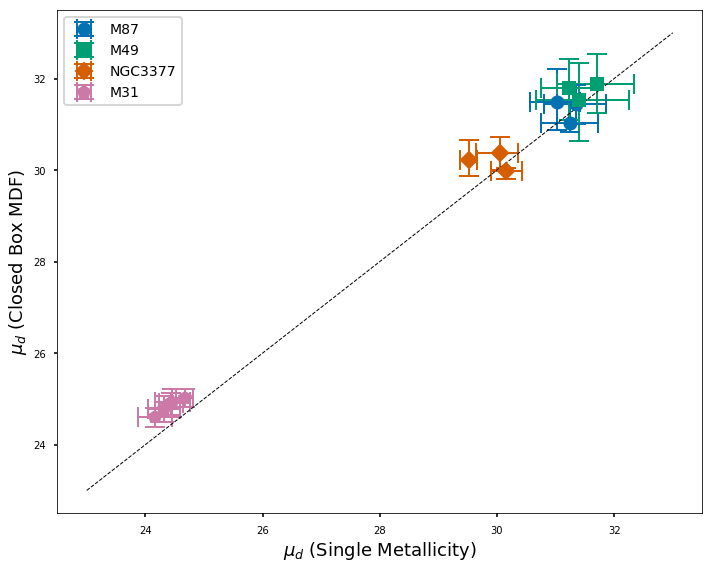

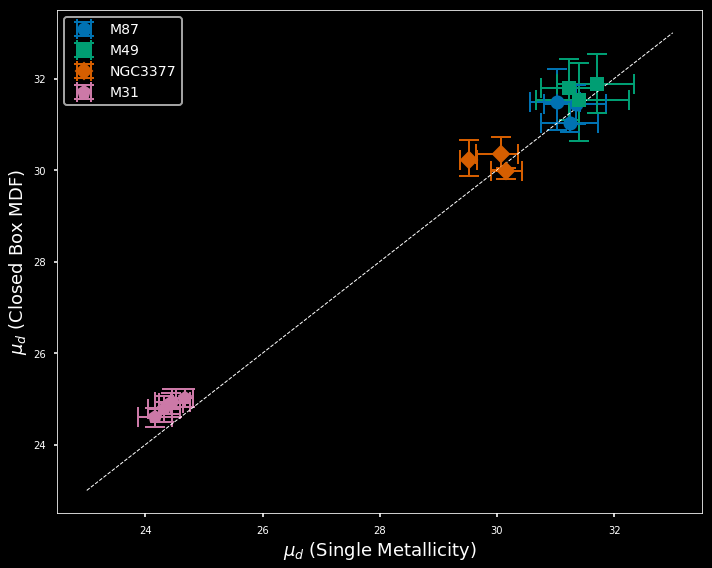

In [45]:
%%savefig_dark_light dmod_agreement.pdf
diffs = {}
fig, ax = plt.subplots(figsize=(10,8))
for i, g in enumerate(tqdm(['M87v2', 'M49', 'NGC3377', 'M31'])):
    marker = markers[i]
    color = colors[i]
    if g in ['M31', 'M51']:
        rs = ['a', 'b', 'c', 'd', 'e']
    else:
        rs = ['a1', 'b1', 'c1']
    for r in rs:
        k1 = f'{g}_{r}_m9'
        k2 = f'{g}_{r}_m11'
        if (k1 not in results) or (k2 not in results):
            continue
        x = np.array([results[k1].get_medians()[-1]])
        y = np.array([results[k2].get_medians()[-1]])
        diffs[k1[:-3]] = x[0]-y[0]
        xerr = [[x - results[k1].get_lower_upper()[0][-1]],
                [results[k1].get_lower_upper()[1][-1] - x]]
        yerr = [[y - results[k2].get_lower_upper()[0][-1]],
                [results[k2].get_lower_upper()[1][-1] - y]]
        ax.errorbar(x=x, y=y, xerr=xerr, yerr=yerr, marker=marker, color=color, capsize=10, linestyle='',
                    label=(g.replace('v2', '') if r==rs[0] else None))
ax.legend(loc=0)
ax.set_xlabel(r'$\mu_d$ (Single Metallicity)', fontsize=18)
ax.set_ylabel(r'$\mu_d$ (Closed Box MDF)', fontsize=18)
ax.plot([23, 33], [23, 33], '--', lw=1, color=('w' if is_dark else 'k'))
# ax.set_xlim([-1.0, 1.5])
# ax.set_ylim([-1.0, 1.5])
fig.tight_layout()

Saving light figure as figures/distance_errors.pdf
Saving dark figure as figures_dark/distance_errors_dark.pdf


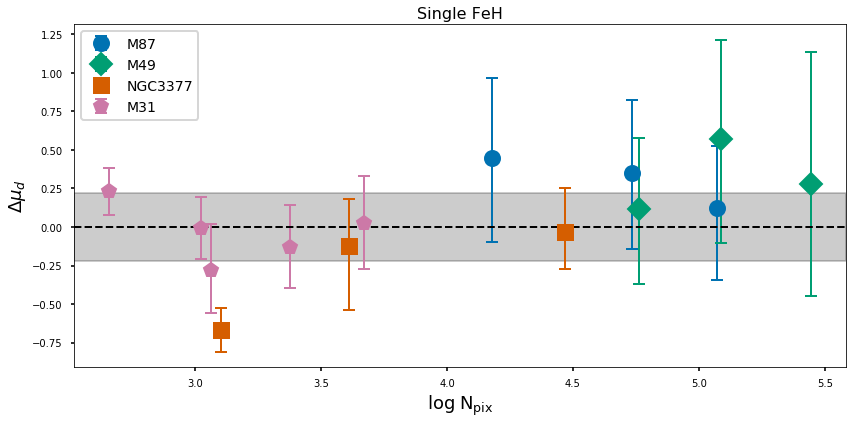

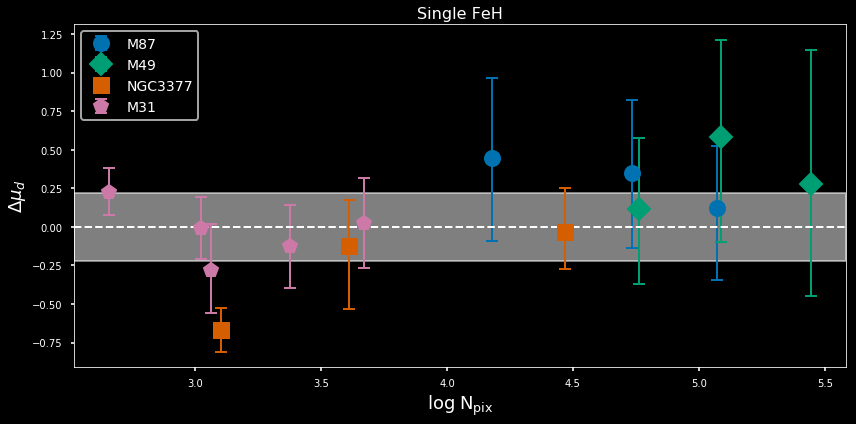

In [102]:
%%savefig_dark_light distance_errors.pdf
fig, ax = plt.subplots(figsize=(12,6))
for i, g in enumerate(['M87v2', 'M49', 'NGC3377', 'M31', 'NGC4993']):
    if g == 'NGC4993':
        continue
    if g in ['M31', 'M51']:
        rs = ['a', 'b', 'c', 'd', 'e']
    else:
        rs = ['a1', 'b1', 'c1']
    for r in rs:
        res = results[f'{g}_{r}_m9']
        x = res.best_model.logNpix
        res.plot_errorbars([None]*8+[ax], x=x, offsets=[0]*8+[dmods[g]], marker=markers[i], color=colors[i], markersize=(25 if markers[i]=='*' else 15),
                          label=(g.replace('v2','') if r==rs[0] else None))

ax.axhline(y=0, ls='--', color=('w' if is_dark else 'k'))
ax.axhspan(-0.22, 0.22, alpha=(0.5 if is_dark else 0.2), color=('w' if is_dark else 'k'))
ax.legend(loc=0)
ax.set_ylabel(r'$\Delta \mu_d$', fontsize=18)
ax.set_xlabel(r'$\log\;\mathrm{N_{pix}}$', fontsize=18)
ax.set_title('Single FeH')
fig.tight_layout()

Saving light figure as figures/distance_errors_all.pdf
Saving dark figure as figures_dark/distance_errors_all_dark.pdf


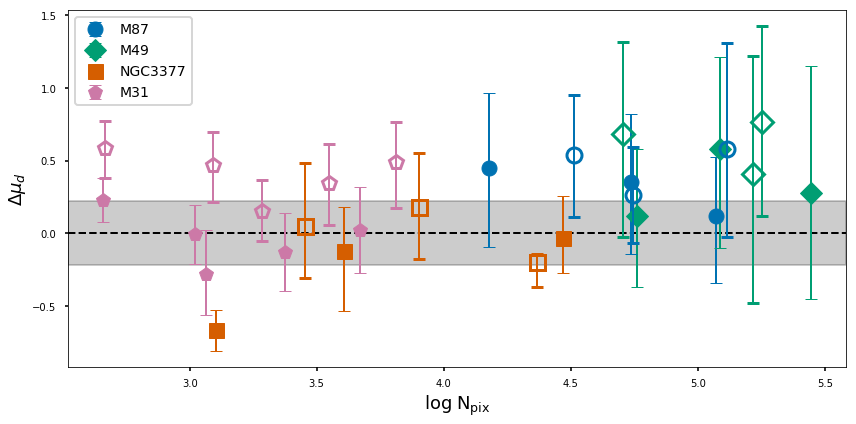

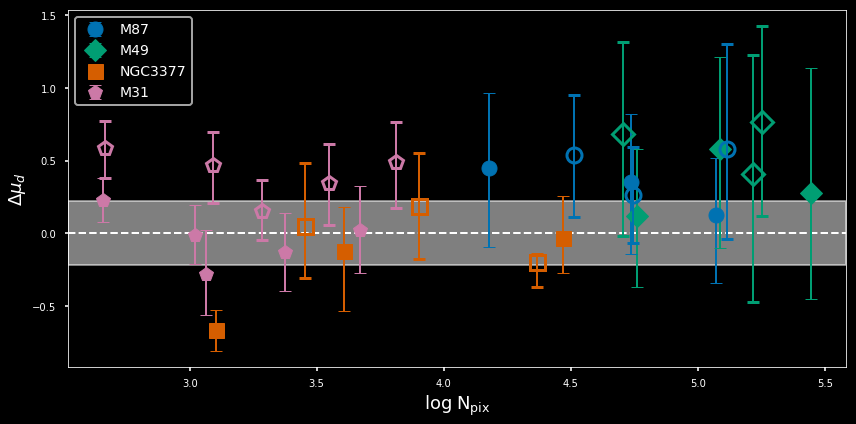

In [103]:
%%savefig_dark_light distance_errors_all.pdf
fig, ax = plt.subplots(figsize=(12,6))
for i, g in enumerate(['M87v2', 'M49', 'NGC3377', 'M31', 'NGC4993']):
    if g == 'NGC4993':
        continue
    if g in ['M31', 'M51']:
        rs = ['a', 'b', 'c', 'd', 'e']
    else:
        rs = ['a1', 'b1', 'c1']
    for r in rs:
        for j, m in enumerate([9, 11]):
            res = results[f'{g}_{r}_m{m}']
            x = res.best_model.logNpix
            res.plot_errorbars([None]*8+[ax], x=x, offsets=[0]*8+[dmods[g]], marker=markers[i], color=colors[i], markersize=(25 if markers[i]=='*' else 15),
                              label=(g.replace('v2','') if (r==rs[0] and j==0) else None), mfc=('None' if j==1 else colors[i]), zorder=(j+10), mew=(1+2*j))

ax.axhline(y=0, ls='--', color=('w' if is_dark else 'k'))
ax.axhspan(-0.22, 0.22, alpha=(0.5 if is_dark else 0.2), color=('w' if is_dark else 'k'))
ax.legend(loc=0)
ax.set_ylabel(r'$\Delta \mu_d$', fontsize=18)
ax.set_xlabel(r'$\log\;\mathrm{N_{pix}}$', fontsize=18)
fig.tight_layout()

Saving light figure as figures/distance_errors_mdf.pdf
Saving dark figure as figures_dark/distance_errors_mdf_dark.pdf


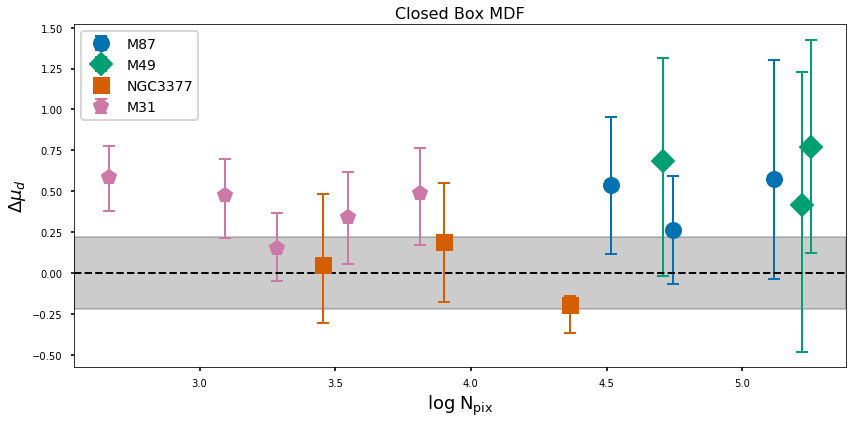

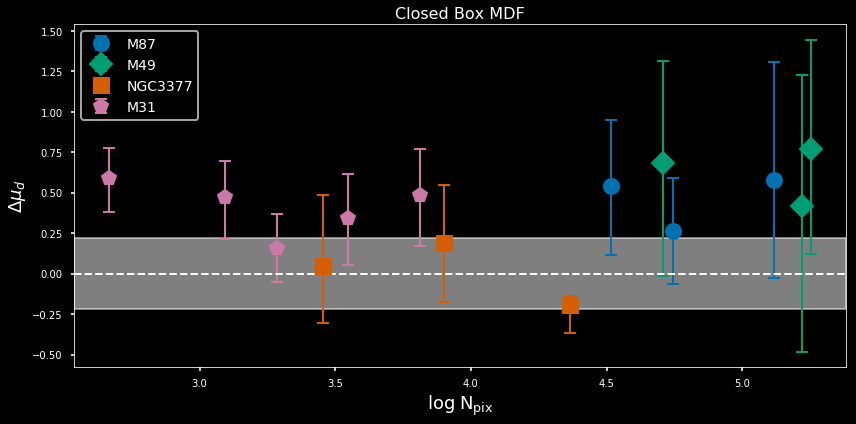

In [104]:
%%savefig_dark_light distance_errors_mdf.pdf
fig, ax = plt.subplots(figsize=(12,6))
for i, g in enumerate(['M87v2', 'M49', 'NGC3377', 'M31', 'NGC4993']):
    if g == 'NGC4993':
        continue
    if g in ['M31', 'M51']:
        rs = ['a',  'b', 'c', 'd', 'e']
    else:
        rs = ['a1', 'b1', 'c1']
    for r in rs:
        res = results[f'{g}_{r}_m11']
        x = res.best_model.logNpix
        res.plot_errorbars([None]*8+[ax], x=x, offsets=[0]*8+[dmods[g]], marker=markers[i], color=colors[i], markersize=(25 if markers[i]=='*' else 15),
                          label=(g.replace('v2','') if r==rs[0] else None))

ax.axhline(y=0, ls='--', color=('w' if is_dark else 'k'))
ax.axhspan(-0.22, 0.22, alpha=(0.5 if is_dark else 0.2), color=('w' if is_dark else 'k'))
ax.legend(loc=0)
ax.set_ylabel(r'$\Delta \mu_d$', fontsize=18)
ax.set_xlabel(r'$\log\;\mathrm{N_{pix}}$', fontsize=18)
ax.set_title('Closed Box MDF')
fig.tight_layout()

Saving light figure as figures/distance_errors_ssp.pdf
Saving dark figure as figures_dark/distance_errors_ssp_dark.pdf


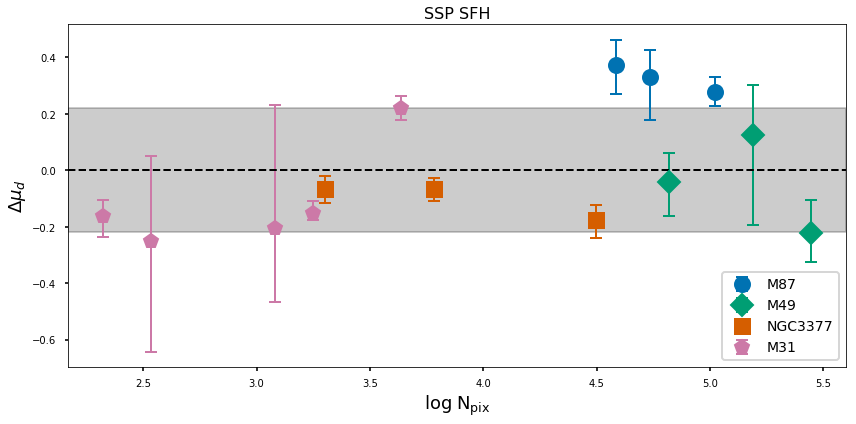

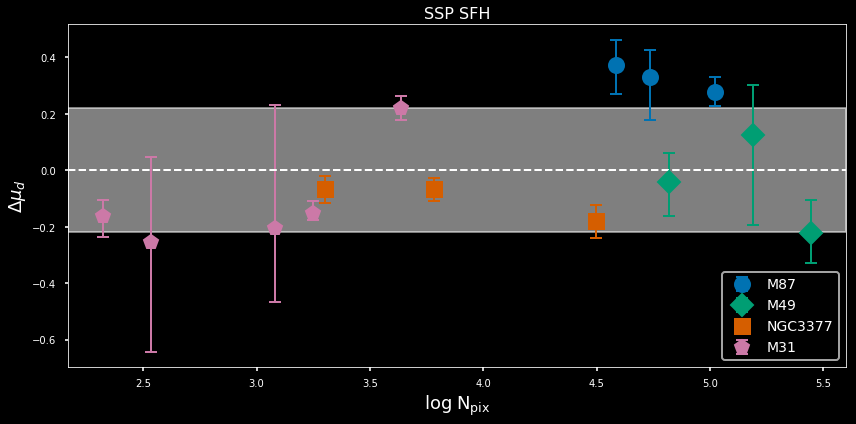

In [105]:
%%savefig_dark_light distance_errors_ssp.pdf
fig, ax = plt.subplots(figsize=(12,6))
for i, g in enumerate(['M87v2', 'M49', 'NGC3377', 'M31', 'NGC4993']):
    if g == 'NGC4993':
        continue
    if g in ['M31', 'M51']:
        rs = ['a',  'b', 'c', 'd', 'e']
    else:
        rs = ['a1', 'b1', 'c1']
    for r in rs:
        res = results[f'{g}_{r}_m8']
        x = res.best_model.logNpix
        res.plot_errorbars([None]*4+[ax], x=x, offsets=[0]*4+[dmods[g]], marker=markers[i], color=colors[i], markersize=(25 if markers[i]=='*' else 15),
                          label=(g.replace('v2','') if r==rs[0] else None))

ax.axhline(y=0, ls='--', color=('w' if is_dark else 'k'))
ax.axhspan(-0.22, 0.22, alpha=(0.5 if is_dark else 0.2), color=('w' if is_dark else 'k'))
ax.legend(loc=0)
ax.set_ylabel(r'$\Delta \mu_d$', fontsize=18)
ax.set_xlabel(r'$\log\;\mathrm{N_{pix}}$', fontsize=18)
ax.set_title('SSP SFH')
fig.tight_layout()

Saving light figure as figures/distance_errors_tau.pdf
Saving dark figure as figures_dark/distance_errors_tau_dark.pdf


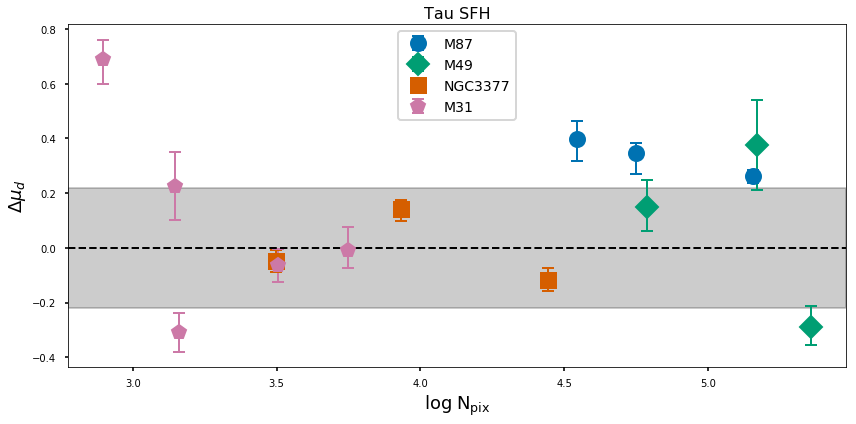

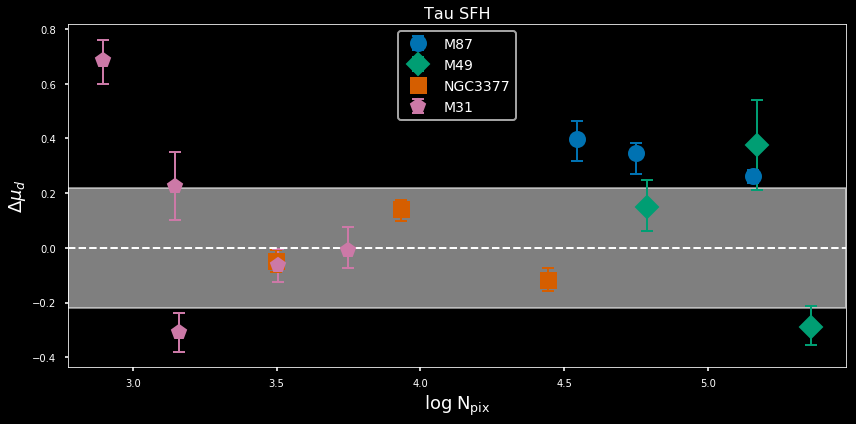

In [106]:
%%savefig_dark_light distance_errors_tau.pdf
fig, ax = plt.subplots(figsize=(12,6))
for i, g in enumerate(['M87v2', 'M49', 'NGC3377', 'M31', 'NGC4993']):
    if g == 'NGC4993':
        continue
    if g in ['M31', 'M51']:
        rs = ['a',  'b', 'c', 'd', 'e']
    else:
        rs = ['a1', 'b1', 'c1']
    for r in rs:
        res = results[f'{g}_{r}_m12']
        x = res.best_model.logNpix
        res.plot_errorbars([None]*4+[ax], x=x, offsets=[0]*4+[dmods[g]], marker=markers[i], color=colors[i], markersize=(25 if markers[i]=='*' else 15),
                          label=(g.replace('v2','') if r==rs[0] else None))

ax.axhline(y=0, ls='--', color=('w' if is_dark else 'k'))
ax.axhspan(-0.22, 0.22, alpha=(0.5 if is_dark else 0.2), color=('w' if is_dark else 'k'))
ax.legend(loc=0)
ax.set_ylabel(r'$\Delta \mu_d$', fontsize=18)
ax.set_xlabel(r'$\log\;\mathrm{N_{pix}}$', fontsize=18)
ax.set_title('Tau SFH')
fig.tight_layout()

# Figure 7 - Distance vs Methods

In [141]:
df_dist = pd.read_csv('../data/Galaxy_Distances.csv')
df_dist

,galaxy,method,dmod,e_syst,e_rand,e_dmod,Mpc,source
0,M31,TRGB,24.44,0.1,0.01,0.10,0.77,Conn+2016
1,M31,TRGB,24.45,0.1,0.05,0.11,0.78,Conn+2012
2,M31,SBF,24.24,0.1,0.08,0.13,0.70,Jensen+2003
3,M31,SBF,24.40,0.1,0.08,0.13,0.76,Tonry+2001
4,M87,TRGB,30.90,0.1,0.08,0.13,15.14,Lee+2016a
5,M87,TRGB,31.12,0.1,0.10,0.14,16.75,Bird+2010
6,M87,SBF,31.11,0.1,0.08,0.13,16.67,Blakeslee+2009
7,M87,SBF,31.18,0.1,0.07,0.12,17.22,Mei+2007
8,M49,SBF,31.17,0.1,0.07,0.12,17.14,Mei+2007
9,M49,SBF,31.12,0.1,0.14,0.17,16.75,Blakeslee+2009


In [142]:
df_m87 = df_dist[df_dist.galaxy == 'M87'].reset_index(drop=True)
df_m87

,galaxy,method,dmod,e_syst,e_rand,e_dmod,Mpc,source
0,M87,TRGB,30.90,0.1,0.08,0.13,15.14,Lee+2016a
1,M87,TRGB,31.12,0.1,0.10,0.14,16.75,Bird+2010
2,M87,SBF,31.11,0.1,0.08,0.13,16.67,Blakeslee+2009
3,M87,SBF,31.18,0.1,0.07,0.12,17.22,Mei+2007


In [143]:
df_m49 = df_dist[df_dist.galaxy == 'M49'].reset_index(drop=True)
df_m49

,galaxy,method,dmod,e_syst,e_rand,e_dmod,Mpc,source
0,M49,SBF,31.17,0.1,0.07,0.12,17.14,Mei+2007
1,M49,SBF,31.12,0.1,0.14,0.17,16.75,Blakeslee+2009
2,M49,SBF,30.90,0.1,0.10,0.14,15.14,Jensen+2003


In [144]:
df_m31 = df_dist[df_dist.galaxy == 'M31'].reset_index(drop=True)
df_m31

,galaxy,method,dmod,e_syst,e_rand,e_dmod,Mpc,source
0,M31,TRGB,24.44,0.1,0.01,0.10,0.77,Conn+2016
1,M31,TRGB,24.45,0.1,0.05,0.11,0.78,Conn+2012
2,M31,SBF,24.24,0.1,0.08,0.13,0.70,Jensen+2003
3,M31,SBF,24.40,0.1,0.08,0.13,0.76,Tonry+2001


In [145]:
df_NGC3377 = df_dist[df_dist.galaxy == 'NGC3377'].reset_index(drop=True)
df_NGC3377

,galaxy,method,dmod,e_syst,e_rand,e_dmod,Mpc,source
0,NGC3377,TRGB,30.18,0.1,0.02,0.10,10.86,Lee+2016b
1,NGC3377,TRGB,30.18,0.1,0.12,0.16,10.86,Harris+2007
2,NGC3377,SBF,30.25,0.1,0.09,0.13,11.22,Tonry+2001
3,NGC3377,SBF,30.12,0.1,0.12,0.16,10.57,Ferrarese+2000


In [146]:
df_M51 = df_dist[df_dist.galaxy == 'M51'].reset_index(drop=True)
df_M51

,galaxy,method,dmod,e_syst,e_rand,e_dmod,Mpc,source
0,M51,TRGB,29.67,0.1,0.02,0.10,8.59,McQuinn+2016
1,M51,TRGB,29.78,0.1,0.13,0.16,9.04,Tikhonov+2015
2,M51,SBF,29.42,0.1,0.25,0.27,7.66,Tonry+2001
3,M51,SBF,29.47,0.1,0.26,0.28,7.83,Ferrarese+2000


In [147]:
def mean_std_distance(gal, model=9, e_syst=0.0, rs=['a1', 'b1', 'c1']):
    means = np.array([results[f'{gal}_{r}_m{model}'].get_means()[-1] for r in rs])
    stds = np.array([results[f'{gal}_{r}_m{model}'].get_stds()[-1] for r in rs])
    wav = np.average(means, weights=stds**-2.)
    std = np.sum(stds**-2.)**-.5
    return wav, np.sqrt(std**2 + e_syst**2)

Saving light figure as figures/distance_methods_M87.pdf
Saving dark figure as figures_dark/distance_methods_M87_dark.pdf


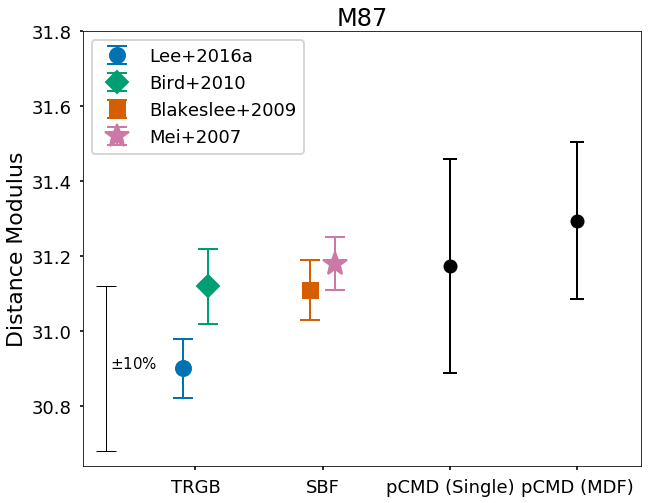

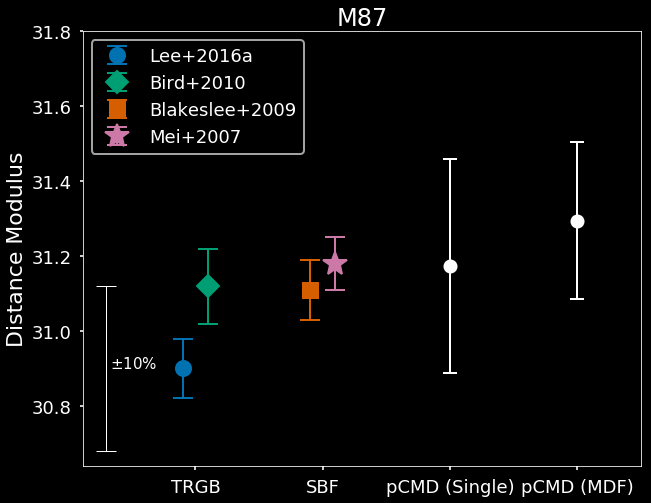

In [148]:
%%savefig_dark_light distance_methods_M87.pdf
fig, ax = plt.subplots(figsize=(10,8))
for i, (m,x) in enumerate(zip(['o', 'D', 's', '*'],[-0.1,0.1,0.9,1.1])):
    ax.errorbar(x=x, y=df_m87.dmod[i], yerr=df_m87.e_rand[i], color=colors[i], marker=m, ls='', label=df_m87.source[i], capsize=10, markersize=(25 if m=='*' else 15))
# for i,r in enumerate(['a1', 'b1', 'c1']):
#     results[f'M87v2_{r}_m9'].plot_errorbars([None]*8+[ax], x=2.0+(0.05*(i-1)), label=('This Work' if i==0 else None), color=('w' if is_dark else 'k'))
ax.errorbar(2, *mean_std_distance('M87v2'), marker='o', ls='', capsize=7, color=('w' if is_dark else 'k'))
ax.errorbar(3, *mean_std_distance('M87v2', model=11), marker='o', ls='', capsize=7, color=('w' if is_dark else 'k'))
#     results[f'M87v2_{r}_m8'].plot_errorbars([None]*4+[ax], x=3.0+(0.05*(i-1)), label=None, color=('w' if is_dark else 'k'))
#     results[f'M87_{r}_m1'].plot_errorbars([None,None,None,None,None,None,None,ax,None], x=2.0+(0.05*(i-1)), label=('This Work' if i==0 else None), color=('w' if is_dark else 'k'))

ax.errorbar(x=-0.7, y=dmods['M87v2'], yerr=0.22, capsize=10, color=('w' if is_dark else 'k'), alpha=1.0, lw=1., capthick=1.)
ax.text(x=-0.67, y=dmods['M87v2'], s=r'$\pm$10%', fontsize=15, alpha=1.0)

plt.setp(ax.get_yticklabels(), fontsize=18)
ax.set_ylabel('Distance Modulus', fontsize=22)
ax.set_xticks([0,1,2, 3])
ax.set_title('M87', fontsize=24)
ax.set_xticklabels(['TRGB', 'SBF', 'pCMD (Single)', 'pCMD (MDF)'], fontsize=18)
ax.set_xlim(xmax=3.5)
ax.set_ylim(ymax=31.8)
ax.legend(loc=2, fontsize=18)

Saving light figure as figures/distance_methods_M31.pdf
Saving dark figure as figures_dark/distance_methods_M31_dark.pdf


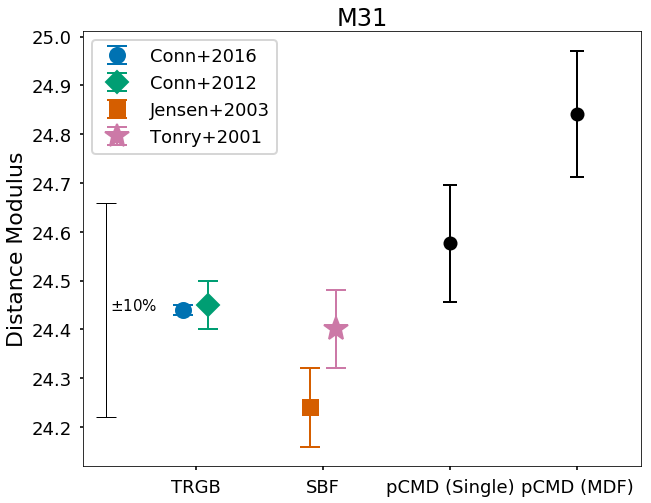

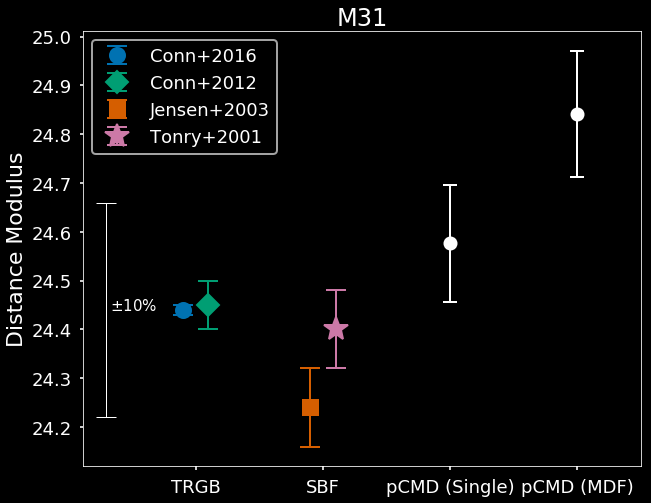

In [149]:
%%savefig_dark_light distance_methods_M31.pdf
fig, ax = plt.subplots(figsize=(10,8))
for i, (m,x) in enumerate(zip(['o', 'D', 's', '*'],[-0.1,0.1,0.9,1.1])):
    ax.errorbar(x=x, y=df_m31.dmod[i], yerr=df_m31.e_rand[i], color=colors[i], marker=m, ls='', label=df_m31.source[i], capsize=10, markersize=(25 if m=='*' else 15))
ax.errorbar(2, *mean_std_distance('M31', rs=['a', 'c', 'e']), marker='o', ls='', capsize=7, color=('w' if is_dark else 'k'))
ax.errorbar(3, *mean_std_distance('M31', rs=['a', 'c', 'e'], model=11), marker='o', ls='', capsize=7, color=('w' if is_dark else 'k'))

ax.errorbar(x=-0.7, y=dmods['M31'], yerr=0.22, capsize=10, color=('w' if is_dark else 'k'), alpha=1.0, lw=1., capthick=1.)
ax.text(x=-0.67, y=dmods['M31'], s=r'$\pm$10%', fontsize=15, alpha=1.0)

plt.setp(ax.get_yticklabels(), fontsize=18)
ax.set_xticks([0,1,2, 3])
ax.set_ylabel('Distance Modulus', fontsize=22)
ax.set_title('M31', fontsize=24)
ax.set_xticklabels(['TRGB', 'SBF', 'pCMD (Single)', 'pCMD (MDF)'], fontsize=18)
ax.set_xlim(xmax=3.5)
ax.legend(loc=2, fontsize=18)

Saving light figure as figures/distance_methods_NGC3377.pdf
Saving dark figure as figures_dark/distance_methods_NGC3377_dark.pdf


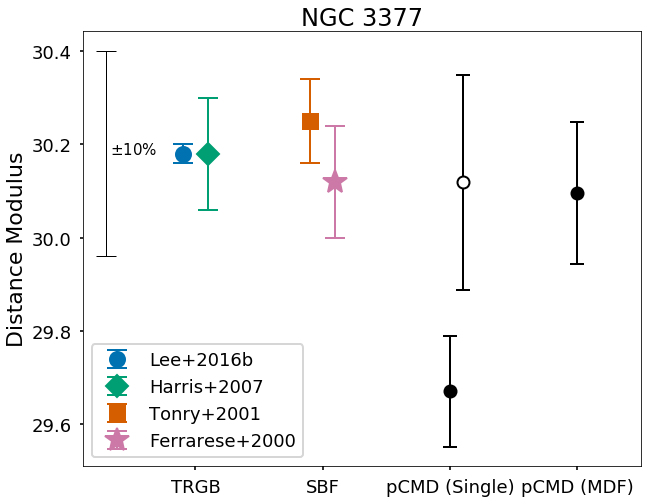

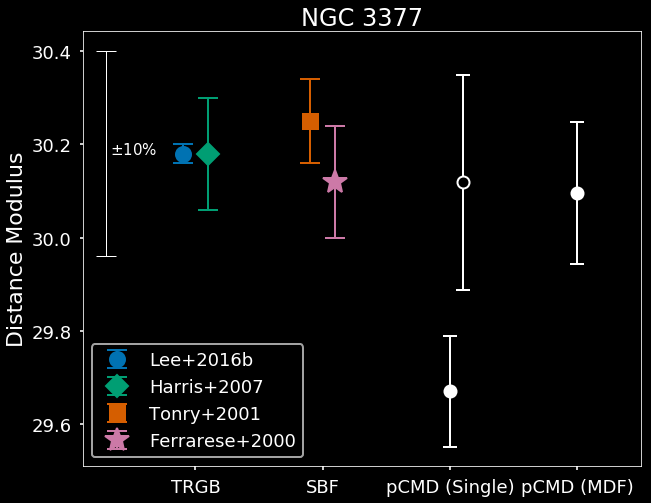

In [150]:
%%savefig_dark_light distance_methods_NGC3377.pdf
fig, ax = plt.subplots(figsize=(10,8))
for i, (m,x) in enumerate(zip(['o', 'D', 's', '*'],[-0.1,0.1,0.9,1.1])):
    ax.errorbar(x=x, y=df_NGC3377.dmod[i], yerr=df_NGC3377.e_rand[i], color=colors[i], marker=m, ls='', label=df_NGC3377.source[i], capsize=10, markersize=(25 if m=='*' else 15))
# for i,r in enumerate(['a1', 'b1', 'c1']):
#     results[f'NGC3377_{r}_m11'].plot_errorbars([None]*8+[ax], x=2.0+(0.05*(i-1)), label=('This Work' if i==0 else None), color=('w' if is_dark else 'k'))
ax.errorbar(2, *mean_std_distance('NGC3377'), marker='o', ls='', capsize=7, color=('w' if is_dark else 'k'))
ax.errorbar(2.1, *mean_std_distance('NGC3377', rs=['a1', 'b1']), marker='o', mfc=('k' if is_dark else 'w'), ls='', capsize=7, color=('w' if is_dark else 'k'))
ax.errorbar(3, *mean_std_distance('NGC3377', model=11), marker='o', ls='', capsize=7, color=('w' if is_dark else 'k'))

ax.errorbar(x=-0.7, y=dmods['NGC3377'], yerr=0.22, capsize=10, color=('w' if is_dark else 'k'), alpha=1.0, lw=1., capthick=1.)
ax.text(x=-0.67, y=dmods['NGC3377'], s=r'$\pm$10%', fontsize=15, alpha=1.0)


ax.set_xticks([0,1,2, 3])
plt.setp(ax.get_yticklabels(), fontsize=18)
ax.set_ylabel('Distance Modulus', fontsize=22)
ax.set_title('NGC 3377', fontsize=24)
ax.set_xticklabels(['TRGB', 'SBF', 'pCMD (Single)', 'pCMD (MDF)'], fontsize=18)
ax.set_xlim(xmax=3.5)
ax.legend(loc=3, fontsize=18)

Saving light figure as figures/distance_methods_M49.pdf
Saving dark figure as figures_dark/distance_methods_M49_dark.pdf


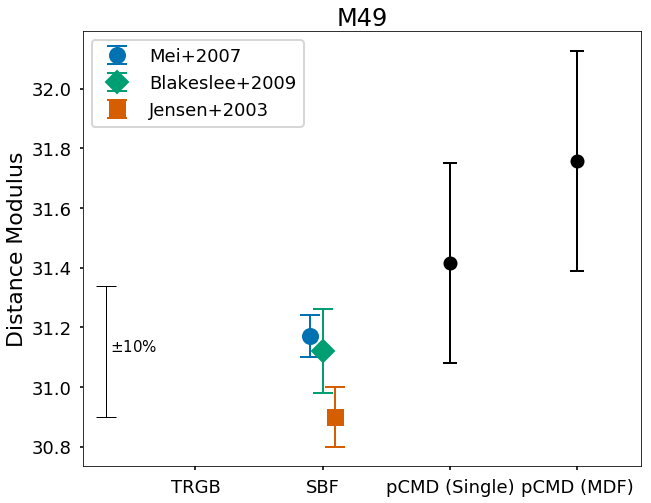

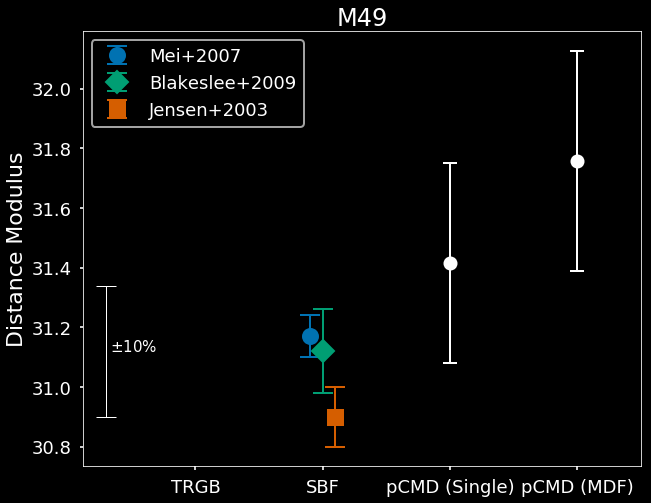

In [151]:
%%savefig_dark_light distance_methods_M49.pdf
fig, ax = plt.subplots(figsize=(10,8))
for i, (m,x) in enumerate(zip(['o', 'D', 's', '*'],[0.9, 1.0, 1.1])):
    ax.errorbar(x=x, y=df_m49.dmod[i], yerr=df_m49.e_rand[i], color=colors[i], marker=m, ls='', label=df_m49.source[i], capsize=10, markersize=(25 if m=='*' else 15))
# for i,r in enumerate(['a1', 'b1', 'c1']):
#     results[f'NGC3377_{r}_m11'].plot_errorbars([None]*8+[ax], x=2.0+(0.05*(i-1)), label=('This Work' if i==0 else None), color=('w' if is_dark else 'k'))
ax.errorbar(2, *mean_std_distance('M49'), marker='o', ls='', capsize=7, color=('w' if is_dark else 'k'))
ax.errorbar(3, *mean_std_distance('M49', model=11), marker='o', ls='', capsize=7, color=('w' if is_dark else 'k'))

ax.errorbar(x=-0.7, y=dmods['M49'], yerr=0.22, capsize=10, color=('w' if is_dark else 'k'), alpha=1.0, lw=1., capthick=1.)
ax.text(x=-0.67, y=dmods['M49'], s=r'$\pm$10%', fontsize=15, alpha=1.0)


ax.set_xticks([0,1,2, 3])
plt.setp(ax.get_yticklabels(), fontsize=18)
ax.set_ylabel('Distance Modulus', fontsize=22)
ax.set_title('M49', fontsize=24)
ax.set_xticklabels(['TRGB', 'SBF', 'pCMD (Single)', 'pCMD (MDF)'], fontsize=18)
ax.set_xlim(xmax=3.5)
ax.legend(loc=0, fontsize=18)

# Figure 11 - FeH Gradients

100%|██████████| 4/4 [00:06<00:00,  1.52s/it]
Saving light figure as figures/feh_agreement.pdf
100%|██████████| 4/4 [00:05<00:00,  1.49s/it]
Saving dark figure as figures_dark/feh_agreement_dark.pdf


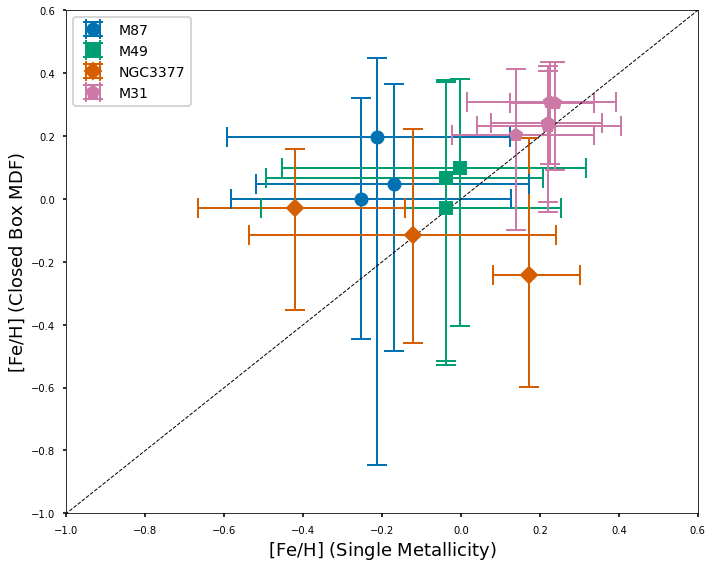

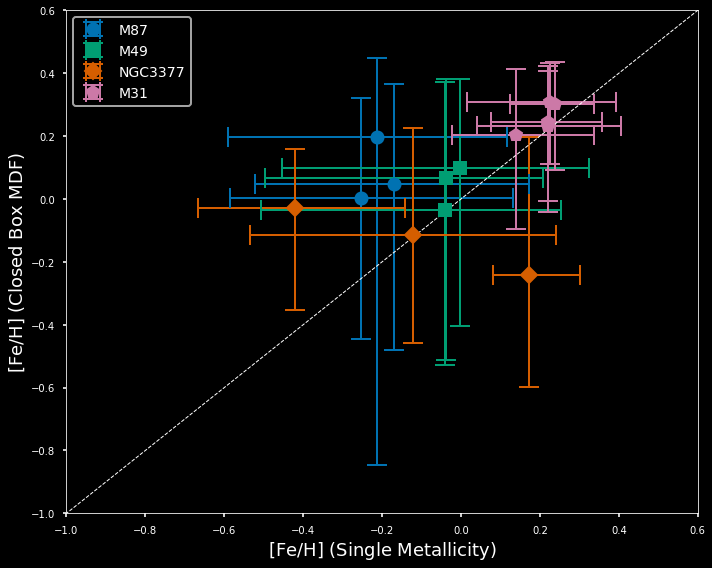

In [85]:
%%savefig_dark_light feh_agreement.pdf
diffs = {}
fig, ax = plt.subplots(figsize=(10,8))
for i, g in enumerate(tqdm(['M87v2', 'M49', 'NGC3377', 'M31'])):
    marker = markers[i]
    color = colors[i]
    if g in ['M31', 'M51']:
        rs = ['a', 'b', 'c', 'd', 'e']
    else:
        rs = ['a1', 'b1', 'c1']
    for r in rs:
        k1 = f'{g}_{r}_m9'
        k2 = f'{g}_{r}_m11'
        if (k1 not in results) or (k2 not in results):
            continue
        x = [results[k1].get_medians()[0]]
        y = [results[k2].get_medians()[0]]
        diffs[k1[:-3]] = x[0]-y[0]
        xerr = [[x - results[k1].get_lower_upper()[0][0]],
                [results[k1].get_lower_upper()[1][0] - x]]
        yerr = [[y - results[k2].get_lower_upper()[0][0]],
                [results[k2].get_lower_upper()[1][0] - y]]
        ax.errorbar(x=x, y=y, xerr=xerr, yerr=yerr, marker=marker, color=color, capsize=10, linestyle='', label=(g.replace('v2', '') if r==rs[0] else None))
ax.legend(loc=0)
ax.set_xlabel(r'$\mathrm{[Fe/H]}$ (Single Metallicity)', fontsize=18)
ax.set_ylabel(r'$\mathrm{[Fe/H]}$ (Closed Box MDF)', fontsize=18)
ax.plot([-1.5, 1.5], [-1.5, 1.5], '--', lw=1, color=('w' if is_dark else 'k'))
ax.set_xlim([-1.0, 0.6])
ax.set_ylim([-1.0, 0.6])
fig.tight_layout()

100%|██████████| 4/4 [00:03<00:00,  1.03it/s]
Saving light figure as figures/feh_grads.pdf
100%|██████████| 4/4 [00:03<00:00,  1.03it/s]
Saving dark figure as figures_dark/feh_grads_dark.pdf


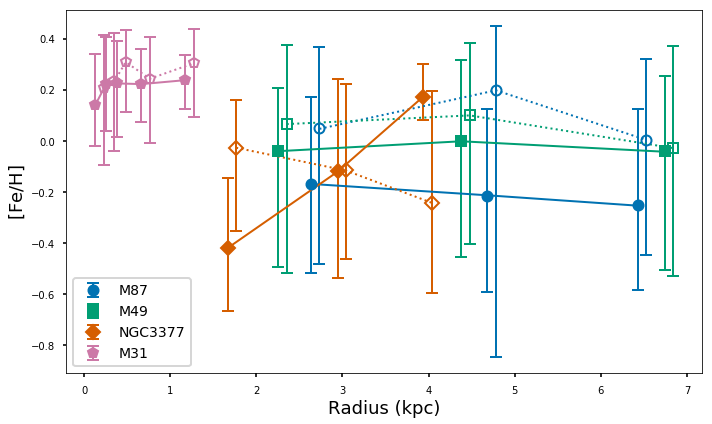

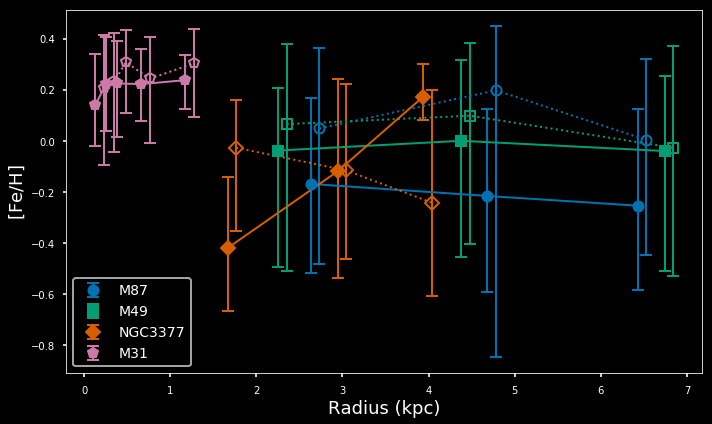

In [184]:
%%savefig_dark_light feh_grads.pdf
fig, ax = plt.subplots(figsize=(10,6))
for i, g in enumerate(tqdm(['M87v2', 'M49', 'NGC3377', 'M31'])):
    if g in ['M31', 'M51']:
        rs = ['a', 'b', 'c', 'd', 'e']
    else:
        rs = ['a1', 'b1', 'c1']
    for j, m in enumerate([9, 11]):
        xs = []
        ys = []
        for r in rs:
            k = f'{g}_{r}_m{m}'
            if k not in results:
                continue
            res = results[k]
            x = radii_kpc[k] + (0.1 if m==11 else 0.0)
            xs.append(x)
            ys.append(res.get_medians()[0])
            res.plot_errorbars([ax]+[None]*8, x=x,  marker=markers[i], color=colors[i], markersize=(20 if markers[i] in ['*'] else 10),
                              label=(g.replace('v2','') if (r==rs[0] and m==9) else None), mfc=('None' if m==11 else colors[i]))
            del res
        xs, ys = np.array(xs)[np.argsort(xs)], np.array(ys)[np.argsort(xs)]
        ax.plot(xs, ys, ls=(':' if m==11 else '-'), marker='', color=colors[i])

ax.legend(loc=0)
ax.set_ylabel(r'$\mathrm{[Fe/H]}$', fontsize=18)
ax.set_xlabel(r'Radius (kpc)', fontsize=18)
# ax.set_title('Single Metallicity')
fig.tight_layout()